In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from scipy.stats import norm
import math
from tqdm import tqdm  # Importa tqdm

from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from statsmodels.tools.sm_exceptions import ConvergenceWarning

from sklearn.linear_model import LinearRegression

# Funciones de Feature Engine
from feature_engine.creation import CyclicalFeatures
from feature_engine.datetime import DatetimeFeatures
from feature_engine.imputation import DropMissingData
from feature_engine.selection import DropFeatures
from feature_engine.timeseries.forecasting import (
     LagFeatures,WindowFeatures)

# Funciones de Scikit Learn
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline

import warnings

## 1. Cargar Datos Historicos

In [2]:
# Función de carga y listado de hojas
def cargar_data(ruta):
    # Leer el archivo y listar las hojas
    excel_file = pd.ExcelFile(ruta)
    print("Hojas disponibles en el archivo:")
    for hoja in excel_file.sheet_names:
        print(f"- {hoja}")    
    # Cargar la hoja seleccionada
    df = excel_file.parse('Histórico ventas reales')
    return df

In [3]:
# Función de carga y listado de hojas
def cargar_data2(ruta):
    # Leer el archivo y listar las hojas
    excel_file = pd.ExcelFile(ruta)
    print("Hojas disponibles en el archivo:")
    for hoja in excel_file.sheet_names:
        print(f"- {hoja}")    
    # Cargar la hoja seleccionada
    df = excel_file.parse('Hoja1')
    return df

In [4]:
df2 = cargar_data2(r'dataset/historico_venta 2022_2024.xlsx')
df2

Hojas disponibles en el archivo:
- Hoja1


,CÓDIGO,REFERENCIA,FEB 2022,MAR 2022,ABR 2022,MAY 2022,JUN 2022,JUl 2022,AGO 2022,SEPT 2022,...,FEB 2024,MAR 2024,ABR 2024,MAY 2024,JUN 2024,JUL 2024,AGO 2024,SEPT 2024,OCT 2024,NOV 2024
0,PT065,NOVAVENTA,0,0,0,0,0,0,0,0,...,17280.0,25650.0,29250.0,25440.0,31530.0,22140.0,35790,24990,28800,21120
1,PT065,DISTRIBUIDORES,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,NaN,2,10443,1590,3
2,PT080,NOVAVENTA,0,0,0,0,0,0,0,0,...,0.0,0.0,10192.0,0.0,0.0,0.0,30,3930,26730,23490
3,PT080,FARMATODO,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1410,2370
4,PT080,E-COMMERCE,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,PT034,DISTRIBUIDORES,1719,100,8820,13670,16455,16875,28085,13715,...,13476.0,16255.0,21516.0,18695.0,19374.0,25594.0,15820,20279,22527,29118
118,PT083,NOVAVENTA,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,33120
119,PT083,FARMATODO,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
120,PT083,E-COMMERCE,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,183


## 2. Preprocesar Datos Parte 1

In [5]:
# Preprocesar tabla
def preprocesar_tabla(df):
    df = df.dropna(subset=['CÓDIGO'])
    df_codigos = df[['CÓDIGO', 'REFERENCIA']].drop_duplicates(subset='CÓDIGO', keep='first').copy()
    df_demanda_cliente = df[df['ABC'].isna()] # Elimina los totales por referencia
    df_demanda_cliente = df_demanda_cliente.rename(columns={'REFERENCIA': 'CLIENTE'})
    df_demanda_cliente = df_demanda_cliente.merge(df_codigos, on='CÓDIGO')
    columnas = df_demanda_cliente.columns.tolist()
    columna_agregada = [col for col in df_codigos.columns if col != 'CODIGO'][0]
    columnas.insert(1, columnas.pop(columnas.index(columna_agregada)))
    df_demanda_cliente = df_demanda_cliente[columnas]
    df_demanda_cliente = df_demanda_cliente.drop(columns=['Nova', 'ABC'])
    df_demanda_cliente = df_demanda_cliente.rename(columns={'CÓDIGO': 'CODIGO'})
    return df_demanda_cliente

In [6]:
def convertir_a_df_vertical(df_demanda_cliente):
    
    columnas_fechas = df_demanda_cliente.columns[3:]    
    # Realizar el melt para transformar el DataFrame en formato largo
    df_vertical = df_demanda_cliente.melt(
        id_vars=['CODIGO', 'REFERENCIA', 'CLIENTE'], 
        value_vars=columnas_fechas,
        var_name='FECHA', 
        value_name='DEMANDA'
    )
    return df_vertical

In [7]:
def convertir_a_df_vertical2(df_demanda_cliente):
    
    columnas_fechas = df_demanda_cliente.columns[2:]    
    # Realizar el melt para transformar el DataFrame en formato largo
    df_vertical = df_demanda_cliente.melt(
        id_vars=['CODIGO', 'CLIENTE'], 
        value_vars=columnas_fechas,
        var_name='FECHA', 
        value_name='DEMANDA'
    )
    return df_vertical

In [8]:
df2 = df2.rename(columns={'CÓDIGO': 'CODIGO', 'REFERENCIA':'CLIENTE'})
df2

,CODIGO,CLIENTE,FEB 2022,MAR 2022,ABR 2022,MAY 2022,JUN 2022,JUl 2022,AGO 2022,SEPT 2022,...,FEB 2024,MAR 2024,ABR 2024,MAY 2024,JUN 2024,JUL 2024,AGO 2024,SEPT 2024,OCT 2024,NOV 2024
0,PT065,NOVAVENTA,0,0,0,0,0,0,0,0,...,17280.0,25650.0,29250.0,25440.0,31530.0,22140.0,35790,24990,28800,21120
1,PT065,DISTRIBUIDORES,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,NaN,2,10443,1590,3
2,PT080,NOVAVENTA,0,0,0,0,0,0,0,0,...,0.0,0.0,10192.0,0.0,0.0,0.0,30,3930,26730,23490
3,PT080,FARMATODO,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1410,2370
4,PT080,E-COMMERCE,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,PT034,DISTRIBUIDORES,1719,100,8820,13670,16455,16875,28085,13715,...,13476.0,16255.0,21516.0,18695.0,19374.0,25594.0,15820,20279,22527,29118
118,PT083,NOVAVENTA,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,33120
119,PT083,FARMATODO,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0
120,PT083,E-COMMERCE,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,183


In [9]:
df3 = convertir_a_df_vertical2(df2)
df3

,CODIGO,CLIENTE,FECHA,DEMANDA
0,PT065,NOVAVENTA,FEB 2022,0.0
1,PT065,DISTRIBUIDORES,FEB 2022,0.0
2,PT080,NOVAVENTA,FEB 2022,0.0
3,PT080,FARMATODO,FEB 2022,0.0
4,PT080,E-COMMERCE,FEB 2022,0.0
...,...,...,...,...
4143,PT034,DISTRIBUIDORES,NOV 2024,29118.0
4144,PT083,NOVAVENTA,NOV 2024,33120.0
4145,PT083,FARMATODO,NOV 2024,0.0
4146,PT083,E-COMMERCE,NOV 2024,183.0


In [10]:
df3['FECHA'].unique()

array(['FEB 2022', 'MAR 2022', 'ABR 2022', 'MAY 2022', 'JUN 2022',
       'JUl 2022', 'AGO 2022', 'SEPT 2022', 'OCT 2022', 'NOV 2022',
       'DIC 2022', 'ENE 2023', 'FEB 2023', 'MAR 2023', 'ABR 2023',
       'MAY 2023', 'JUN 2023', 'JUL 2023', 'AGO 2023', 'SEPT 2023',
       'OCT 2023', 'NOV 2023', 'DIC 2023', 'ENE 2024', 'FEB 2024',
       'MAR 2024', 'ABR 2024', 'MAY 2024', 'JUN 2024', 'JUL 2024',
       'AGO 2024', 'SEPT 2024', 'OCT 2024', 'NOV 2024'], dtype=object)

### 2.1 Mapear nombre de los meses

In [11]:
# Mapear los nombres de las columnas a fechas en formato 'YYYY-MM-DD'
meses = {
    "ENE": "01", "FEB": "02", "MAR": "03", "ABR": "04", "MAY": "05", 
    "JUN": "06", "JUL": "07", "JUl":"07","AGO": "08", "SEPT": "09", "OCT": "10", 
    "NOV": "11", "DIC": "12", 
}

## 3. Convertir Texto a Fecha

In [12]:
def convertir_texto_a_fecha(df_vertical, meses):
    df_vertical['FECHA'].str.extract(r'([A-Z]+) (\d{4})').apply(lambda x: f"{x[1]}-{meses[x[0]]}-01", axis=1) 
    
    # Convertir los nombres de las columnas a fechas
    df_vertical['FECHA'] = pd.to_datetime(
        df_vertical['FECHA']
        .str.extract(r'([A-Z]+) (\d{4})')  # Separar el mes y el año
        .apply(lambda x: f"{x[1]}-{meses[x[0]]}-01", axis=1)  # Formatear a YYYY-MM-DD
    )
    df_vertical_fecha = df_vertical.set_index('FECHA')
    # Resultado
    return df_vertical_fecha

In [13]:
def convertir_texto_a_fecha2(df_vertical, meses):
    # Normalizar texto en la columna 'FECHA'
    df_vertical['FECHA'] = df_vertical['FECHA'].str.upper().str.strip()

    # Extraer mes y año usando regex
    extract = df_vertical['FECHA'].str.extract(r'([A-Z]+) (\d{4})')
    extract.columns = ['mes', 'año']  # Renombrar columnas para claridad

    # Manejar valores no coincidentes
    if extract.isnull().any().any():
        no_validos = df_vertical.loc[extract.isnull().any(axis=1), 'FECHA'].unique()
        raise ValueError(f"Valores no coincidentes en 'FECHA': {no_validos}")

    # Formatear y convertir a fecha
    df_vertical['FECHA'] = pd.to_datetime(
        extract.apply(lambda x: f"{x['año']}-{meses.get(x['mes'], '01')}-01", axis=1)
    )
    
    # Establecer 'FECHA' como índice
    df_vertical_fecha = df_vertical.set_index('FECHA')
    
    return df_vertical_fecha

In [14]:
df_vertical_fecha = convertir_texto_a_fecha2(df3, meses)
df_vertical_fecha

,CODIGO,CLIENTE,DEMANDA
FECHA,,,
2022-02-01,PT065,NOVAVENTA,0.0
2022-02-01,PT065,DISTRIBUIDORES,0.0
2022-02-01,PT080,NOVAVENTA,0.0
2022-02-01,PT080,FARMATODO,0.0
2022-02-01,PT080,E-COMMERCE,0.0
...,...,...,...
2024-11-01,PT034,DISTRIBUIDORES,29118.0
2024-11-01,PT083,NOVAVENTA,33120.0
2024-11-01,PT083,FARMATODO,0.0


## 4. Eliminar Ceros iniciales en las Series de Tiempo

In [15]:
def eliminar_ceros_iniciales(df):
    # Lista para almacenar DataFrames válidos
    lista_df = []

    # Obtener códigos únicos (SKU-cliente)
    codigos_unicos = df['CODIGO'].unique()
    clientes_unicos = df['CLIENTE'].unique()
    
    for codigo in codigos_unicos:
        for cliente in clientes_unicos:
            # Filtrar los datos para cada código y cliente
            df_codigo = df[(df['CODIGO'] == codigo) & (df['CLIENTE'] == cliente)]

            # Verificar si el DataFrame no está vacío
            if not df_codigo.empty:
                # Verificar si hay valores no cero en DEMANDA
                if df_codigo['DEMANDA'].ne(0).any():
                    # Encontrar la primera fila donde la demanda no es cero
                    indice_primer_no_cero = df_codigo['DEMANDA'].ne(0).idxmax()

                    # Recortar la serie temporal desde el primer valor no cero
                    df_codigo_recortado = df_codigo.loc[indice_primer_no_cero:]
                    
                    # Agregar a la lista si no está vacío
                    if not df_codigo_recortado.empty:
                        lista_df.append(df_codigo_recortado)

    # Concatenar todos los DataFrames válidos de una vez
    if lista_df:
        df_resultado = pd.concat(lista_df)
    else:
        df_resultado = pd.DataFrame(columns=df.columns)

    return df_resultado

## 5. Preprocesar Datos Parte 2

In [16]:
def preprocesar_tabla_2(df_resultado):
    # Crear columna CODIGO_CLIENTE
    df_resultado['CODIGO_CLIENTE'] = df_resultado['CODIGO'] + "_" + df_resultado['CLIENTE']
    
    # Seleccionar y copiar las columnas relevantes
    df_mes_cliente = df_resultado[['CODIGO_CLIENTE', 'CODIGO', 'REFERENCIA', 'CLIENTE', 'DEMANDA']].copy()
    
    # Agregar columna AGOTADO
    #df_mes['AGOTADO'] = (df_mes['DEMANDA'] == 0).astype(int)
    
    # Agregar columna MES_DESPUES_AGOTADO
    #df_mes['MES_DESPUES_AGOTADO'] = (df_mes['DEMANDA'].shift(1) == 0).astype(int)
    
    return df_mes_cliente


In [17]:
def preprocesar_tabla_2_2(df_resultado):
    # Crear columna CODIGO_CLIENTE
    df_resultado['CODIGO_CLIENTE'] = df_resultado['CODIGO'] + "_" + df_resultado['CLIENTE']
    
    # Seleccionar y copiar las columnas relevantes
    df_mes_cliente = df_resultado[['CODIGO_CLIENTE', 'CODIGO', 'CLIENTE', 'DEMANDA']].copy()
    
    # Agregar columna AGOTADO
    #df_mes['AGOTADO'] = (df_mes['DEMANDA'] == 0).astype(int)
    
    # Agregar columna MES_DESPUES_AGOTADO
    #df_mes['MES_DESPUES_AGOTADO'] = (df_mes['DEMANDA'].shift(1) == 0).astype(int)
    
    return df_mes_cliente

In [18]:
#ruta_demanda = r'dataset/Consolidado_datos_5.xlsx'
#df = cargar_data(ruta_demanda)
#df_demanda_cliente = preprocesar_tabla(df)
#df_vertical = convertir_a_df_vertical(df_demanda_cliente)
#df_vertical_fecha = convertir_texto_a_fecha(df_vertical, meses)
df_resultado = eliminar_ceros_iniciales(df_vertical_fecha)
df_resultado

,CODIGO,CLIENTE,DEMANDA
FECHA,,,
2023-09-01,PT065,NOVAVENTA,13725.0
2023-10-01,PT065,NOVAVENTA,28890.0
2023-11-01,PT065,NOVAVENTA,9540.0
2023-12-01,PT065,NOVAVENTA,12195.0
2024-01-01,PT065,NOVAVENTA,15210.0
...,...,...,...
2024-11-01,PT034,E-COMMERCE,48.0
2024-11-01,PT083,NOVAVENTA,33120.0
2024-10-01,PT083,DISTRIBUIDORES,43180.0


In [19]:
df_mes_cliente =  preprocesar_tabla_2_2(df_resultado)

In [20]:
df_mes_cliente

,CODIGO_CLIENTE,CODIGO,CLIENTE,DEMANDA
FECHA,,,,
2023-09-01,PT065_NOVAVENTA,PT065,NOVAVENTA,13725.0
2023-10-01,PT065_NOVAVENTA,PT065,NOVAVENTA,28890.0
2023-11-01,PT065_NOVAVENTA,PT065,NOVAVENTA,9540.0
2023-12-01,PT065_NOVAVENTA,PT065,NOVAVENTA,12195.0
2024-01-01,PT065_NOVAVENTA,PT065,NOVAVENTA,15210.0
...,...,...,...,...
2024-11-01,PT034_E-COMMERCE,PT034,E-COMMERCE,48.0
2024-11-01,PT083_NOVAVENTA,PT083,NOVAVENTA,33120.0
2024-10-01,PT083_DISTRIBUIDORES,PT083,DISTRIBUIDORES,43180.0


## 6. Grafica Demanda Original por Cliente

In [21]:
def graficar_demanda_codigo_cliente(df_mes_cliente):
    # Obtener los códigos únicos
    codigos_unicos = df_mes_cliente['CODIGO'].unique()
    
    # Crear la figura de subplots
    fig = make_subplots(
        rows=(len(codigos_unicos) + 2) // 3,  # Para distribuir los subplots en 3 columnas
        cols=3,
        shared_yaxes=False,  # No Compartir el eje Y
        subplot_titles=[f"Código: {codigo}" for codigo in codigos_unicos],
        vertical_spacing=0.018,  # Reducir el espaciado vertical entre los subplots
    )
    
    # Colores específicos para clientes
    cliente_colores = {
        'NOVAVENTA': '#FFA500',  # Naranja
        'DISTRIBUIDORES': "#4682B4",  # Azul Acero
    }
    
    # Asignar un color único para los otros clientes, si los hay
    clientes_unicos = df_mes_cliente['CLIENTE'].unique()
    for i, cliente in enumerate(clientes_unicos):
        if cliente not in cliente_colores:
            # Asignar un color diferente para los otros clientes
            cliente_colores[cliente] = f"rgb({(i * 50) % 256}, {(i * 100) % 256}, {(i * 150) % 256})"
    
    # Iterar sobre cada código para agregar los subplots
    for i, codigo in enumerate(codigos_unicos, start=1):
        # Filtrar los datos para el código actual
        df_codigo = df_mes_cliente[df_mes_cliente['CODIGO'] == codigo]
        
        # Iterar sobre los clientes y agregar una traza por cliente
        for cliente in clientes_unicos:
            df_cliente = df_codigo[df_codigo['CLIENTE'] == cliente]
            fig.add_trace(
                go.Scatter(
                    x=df_cliente.index,  # Usar el índice de fecha
                    y=df_cliente['DEMANDA'],
                    mode='lines',
                    name=cliente,
                    line=dict(color=cliente_colores[cliente]),  # Asignar color específico por cliente
                ),
                row=(i - 1) // 3 + 1,  # Fila en la que estará el subplot
                col=(i - 1) % 3 + 1,   # Columna en la que estará el subplot
            )
    
    # Ajustar la altura total para todos los subplots y actualizar la disposición
    fig.update_layout(
        height=220 * ((len(codigos_unicos) + 2) // 3),  # Aumentar la altura total de los subplots
        title_text="Demanda por Código y Cliente",
        title_x=0.5,  # Centrar el título
        title_font=dict(size=14),  # Tamaño de fuente del título principal
        showlegend=False,  # Eliminar la leyenda
        font=dict(size=10),  # Tamaño de fuente general
        margin=dict(l=50, r=50, t=50, b=50),  # Ajustar márgenes
        template="ggplot2",
#        xaxis=dict(tickformat="%Y-%m-%d"),  # Formato de la fecha
#        xaxis_rangeslider_visible=False,  # Quitar el rango deslizante en el eje X
    )
        # Ajustar los títulos de los subplots
    for annotation in fig['layout']['annotations']:
        annotation['font'] = dict(size=11)  # Reducir tamaño del texto de los títulos de subplots
        
     # Ajustar los títulos de los subplots y ejes
    fig.update_xaxes(title_font=dict(size=9))  # Tamaño de fuente para los títulos del eje X
    fig.update_yaxes(title_font=dict(size=9))  # Tamaño de fuente para los títulos del eje Y
    # Mostrar la figura
    fig.show()


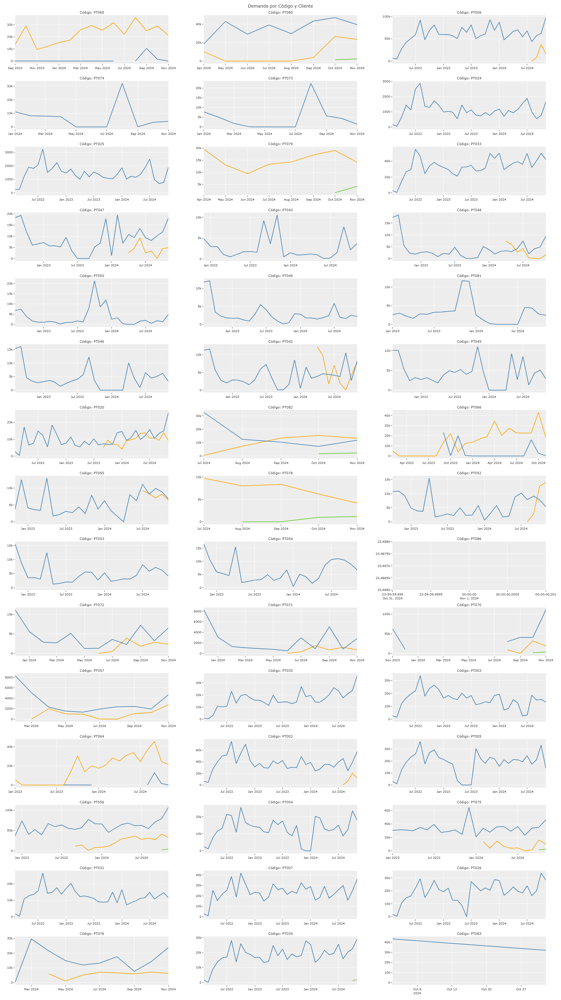

In [22]:
graficar_demanda_codigo_cliente(df_mes_cliente)

## 7. Consolidar Demanda por Codigo

In [23]:
def agrupar_demanda(df_mes_cliente):
    # Agrupar por FECHA y CÓDIGO, conservando REFERENCIA como una columna
    df_mes_orig = (
        df_mes_cliente
        .groupby(['FECHA', 'CODIGO'])  # FECHA sigue siendo el índice
        .agg({ 
            #'REFERENCIA': 'first',
            'DEMANDA': 'sum'})  # SUMA DEMANDA y conserva una REFERENCIA
    ).reset_index().set_index('FECHA')
    
    # Visualizar el resultado
    return df_mes_orig

## 8. Grafica Consolidada por Codigo

In [24]:
def graficar_demanda_codigo(df_mes_orig):
    # Obtener los códigos únicos
    codigos_unicos = df_mes_orig['CODIGO'].unique()
    
    # Crear la figura de subplots
    fig = make_subplots(
        rows=(len(codigos_unicos) + 2) // 3,  # Distribuir en 3 columnas
        cols=3,
        shared_yaxes=False,  # No compartir el eje Y
        subplot_titles=[f"Código: {codigo}" for codigo in codigos_unicos],
        vertical_spacing=0.018,  # Reducir el espaciado entre subplots
    )
    
    # Iterar sobre cada código para agregar subplots
    for i, codigo in enumerate(codigos_unicos, start=1):
        # Filtrar los datos para el código actual
        df_codigo = df_mes_orig[df_mes_orig['CODIGO'] == codigo]
        
        # Agregar una traza al subplot
        fig.add_trace(
            go.Scatter(
                x=df_codigo.index,  # Usar el índice de fecha
                y=df_codigo['DEMANDA'],
                mode='lines',
                name=codigo,
                line=dict(width=2, color = "#4682B4"),  # Personalizar el ancho de la línea
            ),
            row=(i - 1) // 3 + 1,  # Fila en la que estará el subplot
            col=(i - 1) % 3 + 1,   # Columna en la que estará el subplot
        )
    
    # Ajustar el diseño general
    fig.update_layout(
        height=220 * ((len(codigos_unicos) + 2) // 3),  # Altura ajustada según el número de subplots        
        title_text="Demanda por Código",
        title_x=0.5,  # Centrar el título
        title_font=dict(size=14),  # Tamaño de fuente del título principal
        showlegend=False,  # Eliminar la leyenda global
        font=dict(size=10),  # Tamaño de fuente general
        margin=dict(l=50, r=50, t=50, b=50),  # Ajustar márgenes
        template="ggplot2",
    )
    # Ajustar los títulos de los subplots
    for annotation in fig['layout']['annotations']:
        annotation['font'] = dict(size=11)  # Reducir tamaño del texto de los títulos de subplots
        
     # Ajustar los títulos de los subplots y ejes
    fig.update_xaxes(title_font=dict(size=9))  # Tamaño de fuente para los títulos del eje X
    fig.update_yaxes(title_font=dict(size=9))  # Tamaño de fuente para los títulos del eje Y
    # Mostrar la figura
    fig.show()

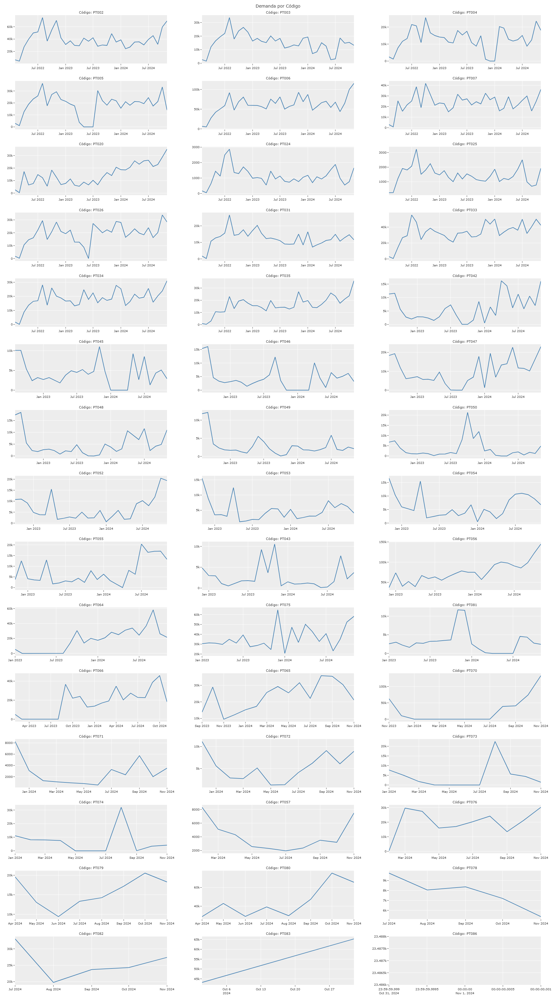

In [25]:
df_mes_orig = agrupar_demanda(df_mes_cliente)
graficar_demanda_codigo(df_mes_orig)

## 9. Reemplazar los ceros por la mediana

In [26]:
def reemplazar_ceros(df_mes_orig):
    
    # Generar copia de trabajo
    df_mes_ceros = df_mes_orig.copy()
    # Reemplazar los valores de demanda iguales a 0 por la mediana correspondiente
    # df_mes_ceros['DEMANDA'] = df_mes_orig.groupby('CODIGO')['DEMANDA'].transform(
    #     lambda x: x.replace(0, x.median())
    #     )
    df_mes_ceros['DEMANDA'] = df_mes_orig.groupby('CODIGO')['DEMANDA'].transform(
        lambda x: x.where(x >= 70, x.median())
    )
    return df_mes_ceros

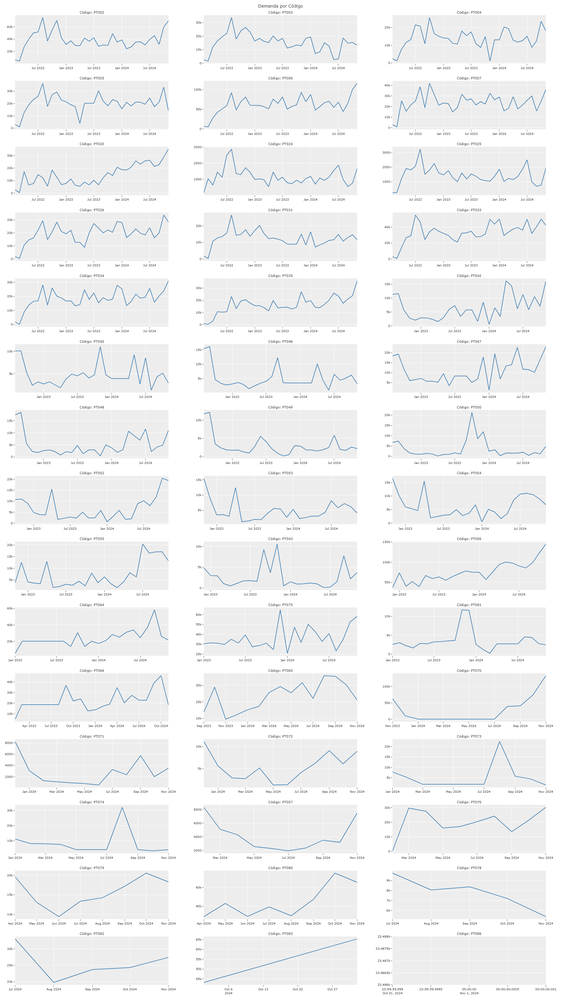

In [27]:
df_mes_ceros = reemplazar_ceros(df_mes_orig)
graficar_demanda_codigo(df_mes_ceros)

## 10. Imputar Outliers con Lim Sup - Lim Inf

* Se crea un pronostico con n=6, para los primeros periodos se va promediando los datos disponibles hasta que tenga 6 datos
* Se definen limites superior e inferior con base en la distribucion normal, 98% y 2% (ajustable)
* Se aplica distribucion normal, lo que quede por fuera de limites se marca como outlier, se recalcula promedio y desviacion
* Se establece lim_sup como pronostico + percentil 98% y lim_inf como pronostico - percentil 2%

In [28]:
def imputar_outliers(df_outliers, sup, inf, n):
    
    # Generar un pronostico Ingenuo
    df_outliers['FORECAST'] = df_outliers['DEMANDA'].rolling(window=n, min_periods=1).mean().shift(1)
    
    # Calcular la mediana de la columna DEMANDA
    mediana_demanda = df_outliers['DEMANDA'].median()
    
    # Reemplazar los valores NaN en la columna FORECAST con la mediana de DEMANDA
    df_outliers['FORECAST'] = df_outliers['FORECAST'].fillna(mediana_demanda)

    # Calular error
    df_outliers['ERROR'] = df_outliers['DEMANDA'] - df_outliers['FORECAST']

    # Calcular Promedio y desviacion
    m = df_outliers['ERROR'].mean()
    s = df_outliers['ERROR'].std()

    # Aplicar Percentil sup e inf
    prob = norm.cdf(df_outliers['ERROR'],m,s)

    # Marcar principales Outliers
    outliers = (prob > sup) | (prob < inf)

    # Recalcular promedio y desviacion SIN principales outliers
    m2 = df_outliers.loc[~outliers,'ERROR'].mean()
    s2 = df_outliers.loc[~outliers,'ERROR'].std()

    # Calcular limite superior e inferior
    df_outliers['LIM_SUP'] = norm.ppf(sup,m2,s2) + df_outliers['FORECAST']
    df_outliers['LIM_INF'] = norm.ppf(inf,m2,s2) + df_outliers['FORECAST']

    # Usar .clip para imputar los valores por fuera de los limites
    df_outliers['NUEVA_DEM'] = df_outliers['DEMANDA'].clip(lower = df_outliers['LIM_INF'], upper= df_outliers['LIM_SUP'])

    # Señalar los valores imputados
    df_outliers['IS_OUTLIER'] = (df_outliers['DEMANDA'] != df_outliers['NUEVA_DEM'])
    
    return df_outliers
    


In [29]:
def eliminar_outliers(df_mes_ceros, sup, inf, n):
    
    # Inicializar el DataFrame acumulado vacío
    df_acumulado = pd.DataFrame()
    # Aplicar la función imputar_outliers a cada grupo (SKU)
    for sku, df_sku in df_mes_ceros.groupby('CODIGO'):
        # Asegurarse de que 'FECHA' sea el índice
        
        # Imputar outliers para cada SKU
        df_imputado = imputar_outliers(df_sku.copy(), sup, inf, n)
        
        # Agregar el resultado al DataFrame acumulado
        df_acumulado = pd.concat([df_acumulado, df_imputado])
    df_outliers = df_acumulado.copy()
    df_acumulado = df_acumulado[['CODIGO',	
                                 #'REFERENCIA', 
                                 'NUEVA_DEM']]
    df_mes = df_acumulado.rename(columns={'NUEVA_DEM':'DEMANDA'})
    # Mostrar el DataFrame acumulado
    return df_mes, df_outliers

In [30]:
outliers = df_outliers[df_outliers['IS_OUTLIER'] == True]
outliers.to_excel('outliers.xlsx')

NameError: name 'df_outliers' is not defined

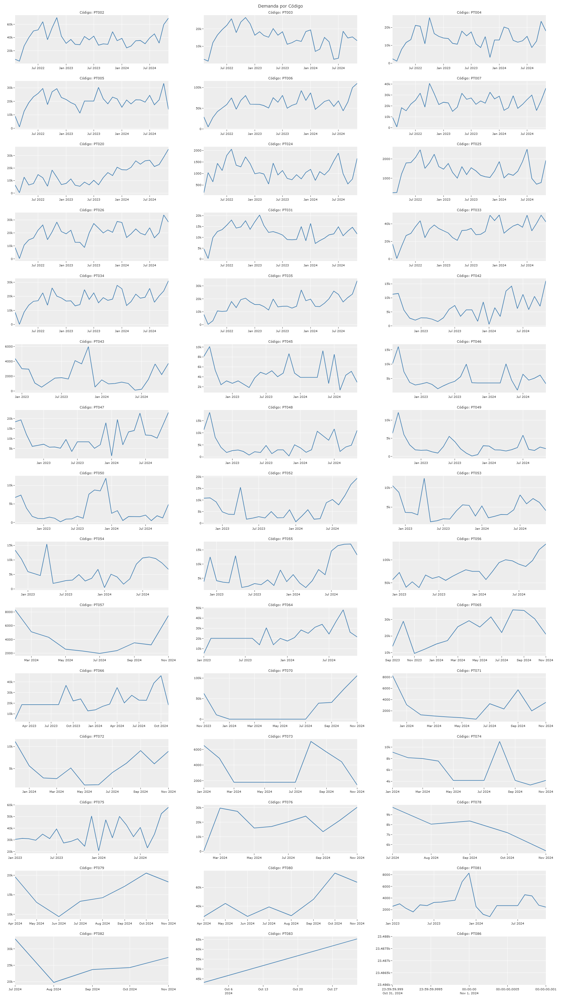

In [31]:
# Definir limites sup e inf
sup = 0.98
inf = 0.02

# Definir n para el pronostico ingenuo
n = 6

# Eliminar Outliers
df_mes, df_outliers = eliminar_outliers(df_mes_ceros, sup, inf, n)
graficar_demanda_codigo(df_mes)

In [32]:
def graficar_outliers_subplots(df_mes_ceros, sup, inf, n):
    # Lista de SKUs únicos
    lista_skus = df_mes_ceros['CODIGO'].unique()
    
    # Calcular número de filas necesarias para 3 columnas
    n_cols = 3
    n_rows = -(-len(lista_skus) // n_cols)  # Redondeo hacia arriba

    # Crear los subplots
    fig = make_subplots(
        rows=n_rows, cols=n_cols,
        subplot_titles=[f"SKU: {sku}" for sku in lista_skus],
        horizontal_spacing=0.05,
        vertical_spacing=0.02
    )
    
    # Definir colores
    color_demanda = "#FF6347"  # Rojo tomate
    color_forecast = "#FFA500"  # Naranja
    color_nueva_dem = "#4682B4" # Azul Acero
    
    # Iterar por cada SKU
    for idx, sku in enumerate(lista_skus):
        # Filtrar por SKU
        df_outliers = df_mes_ceros[df_mes_ceros['CODIGO'] == sku][['DEMANDA']].copy()

        # Aplicar función imputar_outliers
        df_outliers = imputar_outliers(df_outliers, sup, inf, n)

        # Calcular la posición en la cuadrícula
        row = (idx // n_cols) + 1
        col = (idx % n_cols) + 1

        # Agregar trazas al subplot
        fig.add_trace(go.Scatter(
            x=df_outliers.index,
            y=df_outliers["DEMANDA"],
            name=f"Demanda - {sku}",
            mode='lines',
            marker=dict(size=6),
            line=dict(width=2, color=color_demanda)
        ), row=row, col=col)

        fig.add_trace(go.Scatter(
            x=df_outliers.index,
            y=df_outliers["FORECAST"],
            mode='lines',
            name=f"Forecast - {sku}",
            marker=dict(size=6),
            line=dict(width=2.2, dash='solid', color=color_forecast)
        ), row=row, col=col)

        fig.add_trace(go.Scatter(
            x=df_outliers.index,
            y=df_outliers["NUEVA_DEM"],
            mode='lines',
            name=f"Nueva Demanda - {sku}",
            marker=dict(size=6),
            line=dict(width=2, dash='solid', color=color_nueva_dem)
        ), row=row, col=col)

        # Límites superior e inferior
        fig.add_trace(go.Scatter(
            x=df_outliers.index,
            y=df_outliers["LIM_SUP"],
            mode='lines',
            name=f"Límite Superior - {sku}",
            line=dict(color='black', width=1, dash='dot'),
            opacity=0.5
        ), row=row, col=col)

        fig.add_trace(go.Scatter(
            x=df_outliers.index,
            y=df_outliers["LIM_INF"],
            mode='lines',
            name=f"Límite Inferior - {sku}",
            line=dict(color='black', width=1, dash='dot'),
            opacity=0.5
        ), row=row, col=col)

        # Outliers
        if df_outliers["IS_OUTLIER"].any():
            fig.add_trace(go.Scatter(
                x=df_outliers.index[df_outliers["IS_OUTLIER"]],
                y=df_outliers["DEMANDA"].loc[df_outliers["IS_OUTLIER"]],
                mode='markers',
                name=f"Outliers - {sku}",
                marker=dict(color=color_demanda, size=8, symbol='circle')
            ), row=row, col=col)

    # Actualizar diseño global
    fig.update_layout(
        title="Outliers vs Ventas por SKU",
        title_x=0.5,  # Centrar el título
        title_font=dict(size=14),  # Tamaño de fuente del título principal
        font=dict(size=10),  # Tamaño de fuente general
        margin=dict(l=50, r=50, t=50, b=50),  # Ajustar márgenes
        template="ggplot2",
        height=250 * n_rows,  # Ajustar altura según filas
        #width=900,  # Ancho fijo
        showlegend=False  # Ocultar leyenda global
    )
    for annotation in fig['layout']['annotations']:
        annotation['font'] = dict(size=11)  # Reducir tamaño del texto de los títulos de subplots
        
    # Mostrar la figura
    fig.show()

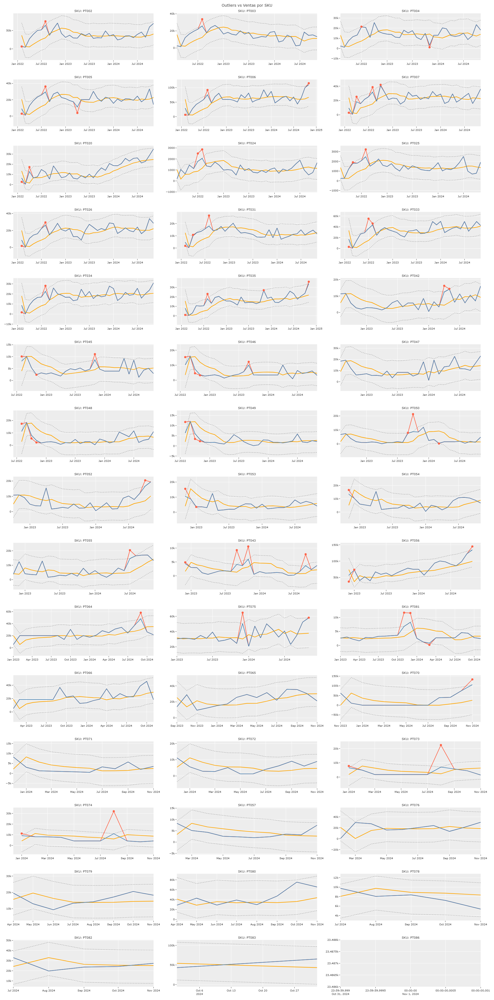

In [33]:
# Llamar la función
graficar_outliers_subplots(df_mes_ceros, sup=0.98, inf=0.02, n=6)

## 11. Funciones generales de ayuda para procesar modelos

### 11.1 Funcion para crear la lista de sku's

In [34]:
def crear_lista_skus(df_mes):
    lista_skus = df_mes['CODIGO'].unique()
    return lista_skus

### 11.2 Funcion para calcular el numero de meses a evaluar por cada SKU

In [35]:
def calcular_meses_a_evaluar(df_sku, periodo_max_evaluacion, porc_eval):
       
    #Calculo del largo de cada serie de tiempo
    largo_serie_tiempo = len(df_sku)
    
    # Calculo del numero de meses a usar como testeo de acuerdo con porc_eval
    meses_evaluar = min(periodo_max_evaluacion, math.ceil(largo_serie_tiempo * porc_eval))

    return meses_evaluar

### 11.3 Funcion para crear el rango de fechas para iterar

In [36]:
def crear_rango_fechas(df_sku, meses_evaluar):
    
    # Seleccionar la fecha mas reciente de los datos originales
    ultima_fecha = df_sku.index.max()
    
    # Definimos la fecha inicial de corte - meses_evaluar -1 
    inicio = ultima_fecha - pd.DateOffset(months=meses_evaluar)
  
    # Creamos un rango de fechas comenzando en inicio y terminando en ultina_fecha, con frecuencia mensual inicio MS
    rango_fechas = pd.date_range(start=inicio, end=ultima_fecha, freq='MS')
   
    #print(f'Los meses a evaluar son: {len(rango_fechas)}')
    
    #print(rango_fechas)

    return rango_fechas

### 11.4 Funciones para calculo y medicion de metricas de error

#### 11.4.1 Función para crear columnas de error, error absoluto, error porcentual y error cuadrado

In [37]:
def crear_columnas_error(df):
    
    df['ERROR'] = df['DEMANDA'] - df['FORECAST'] # Error
    df['ABS_ERROR'] = df['ERROR'].abs() # Error Absoluto
    df['ERROR_PORC'] = np.where(df['DEMANDA'] == 0, 2, df['ABS_ERROR'] / df['DEMANDA']) # Error porcentual, devuelve 200% si la demanda es 0
    df['ERROR_CUADRADO'] = df['ERROR'] ** 2 # Error al cuadrado
    
    return df

#### 11.4.2 Funcion para calcular las metricas totales dado un df con columnas de error

In [38]:
def metricas_error(df):
     
    # Verificar si el total de la demanda es 0
    if df['DEMANDA'].sum() == 0:
        sesgo_porc = 2
        mae_porc = 2
        score = 2
    else:
        sesgo_porc = df['ERROR'].sum() / df['DEMANDA'].sum()
        mae_porc = df['ABS_ERROR'].sum() / df['DEMANDA'].sum()
        score = mae_porc + abs(sesgo_porc)
    
    rmse = np.sqrt(df['ERROR_CUADRADO'].mean())

    return sesgo_porc, mae_porc, rmse, score

#### 11.4.3 Funcion para calcular metricas de error globales para un modelo

In [39]:
def calcular_error_global(df):

    # Calcula las diferente metricas
    mae_global = df['ABS_ERROR'].sum()/df['DEMANDA'].sum()
    sesgo_global = df['ERROR'].sum()/df['DEMANDA'].sum()
    score_global = mae_global + abs(sesgo_global)
    rmse_global = np.sqrt((df['ERROR_CUADRADO']).sum() / df['ERROR'].size)
    
    # Muestra los resultados formateados
    print('MAE% global: {:.2%}'.format(mae_global))
    print('Sesgo% global: {:.2%}'.format(sesgo_global))
    print('Score global: {:.2%}'.format(score_global))
    print('RMSE global: {:.1f}'.format(rmse_global))

    return mae_global, sesgo_global, score_global, rmse_global

In [40]:
def kpi_error_sku(df):
    
    fecha_fin_testeo = df.index.max()
    fecha_inicio_testeo = df.index.min()
       
    df_test = crear_columnas_error(df)
    print('Periodo de Evaluacion desde:')
    print(f"\033[1m{df_test.index.min().strftime('%Y-%m')} hasta {df_test.index.max().strftime('%Y-%m')}\033[0m") #\033[1m{}\033[0m muestra la linea en negrilla
    mae_global, sesgo_global, score_global, rmse_global=calcular_error_global(df_test)
    
    # Agrupar df por sku
    grupo_sku_error = df_test.groupby(['CODIGO'], observed=True).agg({
                                                            'DEMANDA': 'sum',
                                                            'ERROR': 'sum',
                                                            'ABS_ERROR': 'sum',
                                                            'ERROR_CUADRADO': ['sum', 'count'],
                                                            }).reset_index()
    grupo_sku_error.columns = ['CODIGO', 'DEMANDA', 'ERROR', 'ABS_ERROR', 
                             'ERROR_CUADRADO_suma', 'ERROR_CUADRADO_cuenta']
    # Calcular MAE% y Sesgo% de datos agregados por sku
    grupo_sku_error = calcular_error(grupo_sku_error)
    
    # Ordenar el DataFrame por 'SCORE%' en orden ascendente
    grupo_sku_error = grupo_sku_error.sort_values(by='SCORE%')
    
    # Aplicar formato porcentaje
    formatted_columns = grupo_sku_error[['MAE%', 'SESGO%', 'SCORE%']].map(lambda x: f'{x * 100:.2f}%')
    
    # Concatenar la columna "Codigo" sin formatear con las columnas formateadas
    grupo_sku_error_formato = pd.concat([grupo_sku_error[['CODIGO']], formatted_columns], axis=1)
    
    # Mostrar el resultado
    display(grupo_sku_error_formato)

    # Agrupar por codigo y por Lag para almacenar RMSE
    grupo_sku_lag_error = df_test.groupby(['CODIGO', 'LAG'], observed=True).agg({
                                                            'DEMANDA': 'sum',
                                                            'ERROR': 'sum',
                                                            'ABS_ERROR': 'sum',
                                                            'ERROR_CUADRADO': ['sum', 'count'],
                                                            }).reset_index()
    
    grupo_sku_lag_error.columns = ['CODIGO','LAG', 'DEMANDA', 'ERROR', 'ABS_ERROR', 
                             'ERROR_CUADRADO_suma', 'ERROR_CUADRADO_cuenta']
    
    grupo_sku_lag_error = calcular_error(grupo_sku_lag_error)
    
    rmse_sku_lag = grupo_sku_lag_error[['CODIGO','LAG','RMSE']]
    
    # Agrupar por codigo y por Mes para almacenar RMSE
    df_test['Mes'] = df_test.index.month
    grupo_sku_mes_error = df_test.groupby(['CODIGO', 'Mes'], observed=True).agg({
                                                            'DEMANDA': 'sum',
                                                            'ERROR': 'sum',
                                                            'ABS_ERROR': 'sum',
                                                            'ERROR_CUADRADO': ['sum', 'count'],
                                                            }).reset_index()
    grupo_sku_mes_error.columns = ['CODIGO','Mes', 'DEMANDA', 'ERROR', 'ABS_ERROR', 
                             'ERROR_CUADRADO_suma', 'ERROR_CUADRADO_cuenta']
    
    grupo_sku_mes_error = calcular_error(grupo_sku_mes_error)
    
    rmse_sku_mes = grupo_sku_mes_error[['CODIGO','Mes','RMSE']]
    
    return grupo_sku_error_formato, rmse_sku_lag, rmse_sku_mes

#### 11.4.4 Funcion para calcular metricas por una sola linea

In [41]:
def calcular_error(df):
    df['MAE%'] = df['ABS_ERROR']/df['DEMANDA']
    df['SESGO%'] = df['ERROR']/df['DEMANDA']
    df['SCORE%'] = df['MAE%'] + df['SESGO%'].abs()
    if 'ERROR_CUADRADO_suma' in df.columns:
        df['RMSE'] = np.sqrt(df['ERROR_CUADRADO_suma'] / df['ERROR_CUADRADO_cuenta'])
    return df

#### 11.4.5 Funcion para calcular errores por LAG

In [42]:
def evaluar_lags(df):
    # Calcular los scores por lag
    df_lags = df.groupby('LAG')[['ERROR', 'ABS_ERROR', 'DEMANDA']].sum()
        
    # Calcular los scores por lag evitando la división cuando DEMANDA es cero                  
    df_lags['SCORE%'] = np.where(df_lags['DEMANDA'] == 0, 2,
                            (df_lags['ABS_ERROR'] / df_lags['DEMANDA']) + abs(df_lags['ERROR'] / df_lags['DEMANDA'])
                            )
    return df_lags

In [43]:
def kpi_error_lag(df):
    
    fecha_fin_testeo = df.index.max()
    fecha_inicio_testeo = df.index.min()
    
      
    df_test = crear_columnas_error(df)
    print('Periodo de Evaluacion desde:')   
    print(f"\033[1m{df_test.index.min().strftime('%Y-%m')} hasta {df_test.index.max().strftime('%Y-%m')}\033[0m") #\033[1m{}\033[0m muestra la linea en negrilla
    mae_global, sesgo_global, score_global, rmse_global=calcular_error_global(df_test)
    # Agrupar df por mes
    grupo_mes_error = df_test.groupby(['LAG']).agg({
                                                            'DEMANDA': 'sum',
                                                            'ERROR': 'sum',
                                                            'ABS_ERROR': 'sum',
                                                            'ERROR_CUADRADO': ['sum', 'count'],
                                                            }).reset_index()
    grupo_mes_error.columns = ['LAG', 'DEMANDA', 'ERROR', 'ABS_ERROR', 
                             'ERROR_CUADRADO_suma', 'ERROR_CUADRADO_cuenta']
    # Calcular MAE% y Sesgo% de datos agregados por mes
    grupo_mes_error = calcular_error(grupo_mes_error)
    # Aplicar formato porcentaje
    formatted_columns = grupo_mes_error[['MAE%', 'SESGO%', 'SCORE%']].map(lambda x: f'{x * 100:.2f}%')
    
    # Concatenar la columna "Lag" sin formatear con las columnas formateadas
    grupo_mes_error_formato = pd.concat([grupo_mes_error[['LAG']], formatted_columns], axis=1)
    
    # Mostrar el resultado
    display(grupo_mes_error_formato)

    # Agrupar por codigo y por Lag para almacenar RMSE
    grupo_sku_lag_error = df_test.groupby(['CODIGO', 'LAG'], observed=True).agg({
                                                            'DEMANDA': 'sum',
                                                            'ERROR': 'sum',
                                                            'ABS_ERROR': 'sum',
                                                            'ERROR_CUADRADO': ['sum', 'count'],
                                                            }).reset_index()
    grupo_sku_lag_error.columns = ['CODIGO', 'LAG', 'DEMANDA', 'ERROR', 'ABS_ERROR', 
                             'ERROR_CUADRADO_suma', 'ERROR_CUADRADO_cuenta']
    
    grupo_sku_lag_error = calcular_error(grupo_sku_lag_error)
    rmse_sku_lag = grupo_sku_lag_error[['CODIGO', 'LAG','RMSE']]

    
    return grupo_mes_error_formato, df_test

### 11.5 Funciones para formatear y graficar

#### 11.5.1 Funcion para adicionar nombre del modelo

In [44]:
def adicionar_nombre_modelo_serie_tiempo(df, nombre_modelo):
    df['MODELO'] = nombre_modelo
    df = df[['CODIGO','FORECAST','LAG','MODELO']]
    return df

## 12. Simulacion promedio movil simple PMS

Evalúa y genera pronósticos PMS para un grupo de SKUs, seleccionando el mejor n con base en el score.

Args:
* df_mes (DataFrame): DataFrame con datos de demanda por SKU.
* lista_skus (list): Lista de SKUs a evaluar.
* periodo_max_evaluacion (int): Máximo periodo a evaluar.
* porc_eval (float): Porcentaje de datos a usar para evaluación.
* meses_a_pronosticar_evaluacion (int): Número de meses a pronosticar

Devuelve:
* DataFrame df_mejor_n: Información del mejor n, metricas, pronostico por SKU.
* DataFrame df_forecast_pms: Datos de pronósticos seleccionados.


In [67]:
def evaluar_y_generar_pms(df_mes, df_mes_ceros, lista_skus, periodo_max_evaluacion, porc_eval, meses_a_pronosticar_evaluacion):
    
    mejor_n = [] # Bolsa para guardar resultados por cada sku
    acumulado_forecast = [] # Bolsa para guardar los resultados de todos los pronosticos
        
    for sku in tqdm(lista_skus, desc="Procesando SKUs"):
    
        resultados_n = [] # Bolsa para guardar resultados evalaudos por cada n
        resultados_datos_evaluacion = [] # Bolsa para guardar datos sin evaluar por cada n
        
        df_sku_fecha = df_mes[df_mes['CODIGO'] == sku].copy() # Filtrar df_mes por cada Sku
        df_sku_fecha_ceros = df_mes_ceros[df_mes_ceros['CODIGO'] == sku].copy() # Filtrar df_mes_ceros por cada Sku
        
        # Evaluar el largo de la serie de tiempo y calcular meses a evaluar aper cada sku
        meses_evaluar = calcular_meses_a_evaluar(df_sku_fecha, periodo_max_evaluacion, porc_eval)
    
        # Crear el rango de fechas para cortar el set de datos de acuerdo con meses a evaluar
        rango_fechas = crear_rango_fechas(df_sku_fecha, meses_evaluar)
       
        # Tamaño de histórico n maximo y rango   
        n_max = max(2, len(df_sku_fecha) - meses_evaluar)        
        rango_n = range(1, n_max)
        
        # Iterar por cada posible tamaño de n
        for n in rango_n: 
            
            datos_evaluacion = []  # Bolsa para guardar resultados evaluados
            ultimo_forecast_n = None  # Variable para almacenar el último forecast de cada n
        
            for fecha_corte in rango_fechas:
                # Filtrar datos hasta la fecha de corte
                df_sku_fecha_temp = df_sku_fecha[df_sku_fecha.index <= fecha_corte].copy()
                
                if len(df_sku_fecha_temp['DEMANDA']) > 1:
                    # Calcular el forecast usando una media móvil con ventana n
                    #print(len(df_sku_fecha_temp['DEMANDA']))
                    df_sku_fecha_temp['FORECAST'] = df_sku_fecha_temp['DEMANDA'].rolling(window=n, min_periods=1).mean()
 
                    forecast = [df_sku_fecha_temp['FORECAST'].iloc[-1]]

                else:
                    forecast = [np.NaN]
                
                # Generar los próximos lags para el forecast actual            
                datos_forecast = pd.DataFrame({                
                    'fecha':fecha_corte,
                    'n':n,
                    'CODIGO': sku,
                    'FORECAST': forecast,
                    'LAG': [f'Lag_{i}' for i in range(1, meses_a_pronosticar_evaluacion + 1)]}, index=[df_sku_fecha_temp.index[-1] 
                                      + pd.DateOffset(months=i) for i in range(1, meses_a_pronosticar_evaluacion + 1)]) # Genera titulo Lags dinamicamente
                 
                # Unir forecast con la demanda real para evaluar
                datos_forecast_demanda = datos_forecast.merge(df_sku_fecha_ceros[['DEMANDA']], 
                                                how='left', left_index=True, right_index=True).dropna()               
                
                
                # Acumular data frames por cada fecha
                datos_evaluacion.append(datos_forecast_demanda)
                
                # Guardar el último forecast de esta iteración de fecha_corte
                ultimo_forecast_n = datos_forecast  # Se actualiza en cada fecha_corte               
                       
            # Concatenar todos los DataFrames de la evaluación
            df_evaluacion_final = pd.concat(datos_evaluacion)#.dropna()
                       
            # Calcular columnas de error
            df_columnas_error = crear_columnas_error(df_evaluacion_final)
            
            # Calcular métricas de error
            sesgo_porc, mae_porc, rmse, score = metricas_error(df_columnas_error)
              
            # Calcular los scores por lag
            df_lags = evaluar_lags(df_columnas_error)
            
            # Agregar resultados y el último forecast de cada n a la lista resultados_n
            resultados_n.append({
                'CODIGO':sku,
                'parametro': n,         
                'sesgo_porc': sesgo_porc,        
                'mae_porc': mae_porc,        
                'rmse': rmse,
                'score': score,
                **{f'score_{lag}': score_value for lag, score_value in zip(df_lags.index, df_lags['SCORE%'])},  # Agrega dinámicamente scores por lag
                'ultimo_forecast': forecast[0],  # Guarda el último forecast de n                
            })                  

            # Acumula los datos de pronostico para evaluacion aparte
            resultados_datos_evaluacion.append({                
                'score': score,
                'datos_evaluacion': datos_evaluacion
            })
           
        # Crear el DataFrame final 
        df_kpi = pd.DataFrame(resultados_n)
        # Crear df con info del n con menor score
        df_min_score = df_kpi[df_kpi['score'] == df_kpi['score'].min()]
        # Seleccionar el forecast correspondiente al mejor score de df_min_score
        forecast_optimo = df_min_score['ultimo_forecast'].iloc[0]
        #Acumular df con resultados por sku
        mejor_n.append(df_min_score)
        
        # Crear un data frame con los datos de evaluacion 
        df_kpi_datos_evaluacion = pd.DataFrame(resultados_datos_evaluacion) 
        # Seleccionar el n con menor score
        mejor_n_row = df_kpi_datos_evaluacion[df_kpi_datos_evaluacion['score'] == df_kpi_datos_evaluacion['score'].min()].iloc[0]
        # Recuperar los datos del mejor n
        mejor_n_datos = mejor_n_row['datos_evaluacion']  
       # Almacenar los datos del mejor n para este SKU
        acumulado_forecast.extend(mejor_n_datos)     
       
    # Concatenar mejor_n para obtener un solo df
    df_mejor_n = pd.concat(mejor_n)
    # Eliminar duplicados conservando solo el primer codigo
    df_mejor_n = df_mejor_n.drop_duplicates(subset='CODIGO', keep='first')
    # Mover ultimo_forecast a la ultima columna
    columnas = [col for col in df_mejor_n.columns if col != 'ultimo_forecast'] + ['ultimo_forecast']
    df_mejor_n = df_mejor_n[columnas]
    
    df_forecast_pms = pd.concat(acumulado_forecast, ignore_index=False)
   
    return df_mejor_n, df_forecast_pms 

In [69]:
lista_skus = crear_lista_skus(df_mes)
for i in lista_skus:
    abc = df_mes[df_mes['CODIGO'] == i] 
    print(len(abc['DEMANDA']))

34
34
34
34
34
34
34
34
34
34
34
34
34
34
28
24
28
28
28
28
28
28
26
25
25
25
24
10
23
15
22
13
12
12
11
11
23
10
5
8
8
23
5
2
1


In [70]:
lista_skus = crear_lista_skus(df_mes)
lista_skus = lista_skus[:-1]
meses_a_pronosticar_evaluacion = 6 # Numero de meses a pronosticar
periodo_max_evaluacion = 12
porc_eval = 0.35
df_mejor_n, df_forecast_pms = evaluar_y_generar_pms(df_mes, df_mes_ceros, lista_skus, periodo_max_evaluacion, porc_eval, meses_a_pronosticar_evaluacion)

Procesando SKUs: 100%|██████████| 44/44 [00:22<00:00,  1.92it/s]


In [71]:
df_mejor_n

,CODIGO,parametro,sesgo_porc,mae_porc,rmse,score,score_Lag_1,score_Lag_2,score_Lag_3,score_Lag_4,score_Lag_5,score_Lag_6,ultimo_forecast
20,PT002,21,0.056465,0.273402,14893.629704,0.329867,0.295139,0.318169,0.332525,0.333104,0.348754,0.370613,37554.380952
3,PT003,4,-0.051021,0.475770,6561.041401,0.526792,0.466173,0.505293,0.610174,0.565590,0.549244,0.607260,15491.250000
20,PT004,21,0.056734,0.242298,4574.230280,0.299032,0.290698,0.326004,0.352104,0.293172,0.236399,0.267367,13857.559200
17,PT005,18,0.000980,0.173020,5248.608278,0.174001,0.172997,0.188568,0.168222,0.183162,0.195151,0.205805,21236.500000
7,PT006,8,0.055535,0.230706,22982.251918,0.286241,0.282857,0.311230,0.265558,0.266300,0.273557,0.320814,72121.489897
12,PT007,13,-0.002832,0.226870,6452.663116,0.229703,0.231461,0.245239,0.267294,0.230333,0.247078,0.212628,24843.000000
0,PT020,1,0.142729,0.188383,5708.552917,0.331113,0.214960,0.294342,0.308017,0.356234,0.427938,0.456240,35098.000000
20,PT024,21,0.034041,0.295898,420.425379,0.329939,0.300245,0.311884,0.316913,0.323219,0.358113,0.397414,1036.571429
15,PT025,16,0.003083,0.349161,564.806255,0.352244,0.334688,0.348484,0.390680,0.347016,0.371802,0.409979,1336.250000
5,PT026,6,0.016198,0.212009,5973.449733,0.228207,0.248554,0.237206,0.229286,0.222382,0.226761,0.211675,23478.833333


In [72]:
def construir_pronostico(df_mejor, df_mes, meses_a_pronosticar_produccion, nombre_modelo):

    # Crear un nuevo DataFrame para almacenar los resultados
    data = []
    
    # Iterar por cada fila de df_mejor
    for _, row in df_mejor.iterrows():
        codigo = row["CODIGO"]
        ultimo_forecast = row["ultimo_forecast"]
        # Generar las fechas para los meses pronosticados
        fechas = [df_mes.index.max() + pd.DateOffset(months=i) for i in range(1, meses_a_pronosticar_produccion + 1)]
    
        # Generar las filas para los meses pronosticados
        for i, fecha in enumerate(fechas, start=1):
            data.append({
                "FECHA": fecha,
                "CODIGO": codigo,
                "FORECAST": ultimo_forecast,
                "LAG": f"Lag_{i}"
            })
    
    # Crear el nuevo DataFrame
    df_forecast = pd.DataFrame(data)
    df_forecast = df_forecast.set_index('FECHA')
    df_forecast['MODELO'] = nombre_modelo
    
    # Visualizar el resultado
    return df_forecast


In [73]:
meses_a_pronosticar_produccion = 12
df_forecast_final_pms = construir_pronostico(df_mejor_n, df_mes, meses_a_pronosticar_produccion, 'pms')
df_forecast_final_pms

,CODIGO,FORECAST,LAG,MODELO
FECHA,,,,
2024-12-01,PT002,37554.380952,Lag_1,pms
2025-01-01,PT002,37554.380952,Lag_2,pms
2025-02-01,PT002,37554.380952,Lag_3,pms
2025-03-01,PT002,37554.380952,Lag_4,pms
2025-04-01,PT002,37554.380952,Lag_5,pms
...,...,...,...,...
2025-07-01,PT083,65263.000000,Lag_8,pms
2025-08-01,PT083,65263.000000,Lag_9,pms
2025-09-01,PT083,65263.000000,Lag_10,pms


In [74]:
grupo_mes_error_formato_pms, df_test_pms = kpi_error_lag(df_forecast_pms)


Periodo de Evaluacion desde:
2023-12 hasta 2024-11
MAE% global: 28.63%
Sesgo% global: 12.29%
Score global: 40.93%
RMSE global: 11326.3


,LAG,MAE%,SESGO%,SCORE%
0,Lag_1,25.53%,8.00%,33.53%
1,Lag_2,29.96%,11.21%,41.17%
2,Lag_3,30.46%,12.62%,43.08%
3,Lag_4,29.86%,14.34%,44.20%
4,Lag_5,28.77%,15.80%,44.57%
5,Lag_6,27.72%,15.27%,42.99%


In [76]:
grupo_sku_error_formato_pms, rmse_sku_lag_pms, rmse_sku_mes_pms = kpi_error_sku(df_forecast_pms)

Periodo de Evaluacion desde:
2023-12 hasta 2024-11
MAE% global: 28.63%
Sesgo% global: 12.29%
Score global: 40.93%
RMSE global: 11326.3


,CODIGO,MAE%,SESGO%,SCORE%
3,PT005,17.30%,0.10%,17.40%
11,PT033,17.53%,0.72%,18.25%
42,PT082,9.34%,9.34%,18.68%
10,PT031,20.13%,0.71%,20.83%
9,PT026,21.20%,1.62%,22.82%
5,PT007,22.69%,-0.28%,22.97%
29,PT065,21.88%,1.35%,23.23%
12,PT034,18.38%,7.26%,25.63%
4,PT006,23.07%,5.55%,28.62%
2,PT004,24.23%,5.67%,29.90%


## 13. Suavizacion Exponencial Simple

In [77]:
def encontrar_mejor_se(df_mes, df_mes_ceros, lista_skus, periodo_max_evaluacion, porc_eval, meses_a_pronosticar_evaluacion):
    
    mejor_se = [] # Bolsa para guardar resultados por cada sku
    resultados_se = []  # Bolsa para guardar resultados por cada n
    acumulado_df_evaluacion_final = [] # Bolsa para guardar los resultados de todos los pronosticos
        
    for sku in tqdm(lista_skus, desc="Procesando SKUs"):
                
        datos_evaluacion_se = []  # Bolsa para guardar resultados de evaluación por fecha
                
        df_sku_fecha = df_mes[df_mes['CODIGO'] == sku].copy() # Filtrar df_almacen_semana por cada SKU
        df_sku_fecha_ceros = df_mes_ceros[df_mes_ceros['CODIGO'] == sku].copy() # Filtrar df_mes_ceros por cada Sku            
        
        # Evaluar el largo de la serie de tiempo y calcular meses a evaluar para cada sku
        meses_evaluar = calcular_meses_a_evaluar(df_sku_fecha, periodo_max_evaluacion, porc_eval)
    
        # Crear el rango de fechas para corar el set de datos de acuerdo con meses a evaluar
        rango_fechas = crear_rango_fechas(df_sku_fecha, meses_evaluar)

        # Iterar por fecha
        for fecha_corte in rango_fechas:
            
            # Filtrar datos hasta la fecha de corte
            df_sku_fecha_temp = df_sku_fecha[df_sku_fecha.index <= fecha_corte].copy()                 
    
            # Extraer la demanda como un array
            demanda = df_sku_fecha_temp['DEMANDA'].values

            # Chequeo de la longitud de cada serie de tiempo
            if len(demanda) < 2:
                print(f'El sku {sku} no tiene suficientes datos para la fecha de corte {fecha_corte}') # Ver SKUs con datos insuficientes y su fecha de corte
                forecast = np.NaN
            else:                            
                with warnings.catch_warnings():
                    warnings.filterwarnings("ignore", category=ConvergenceWarning)
                    model = SimpleExpSmoothing(demanda).fit(smoothing_level=None, optimized=True)
   
                    # Calcular pronostico para los proximos periodos
                    forecast = model.forecast(steps=meses_a_pronosticar_evaluacion)
                           
                    # Generar los próximos lags para el forecast actual            
                    datos_forecast = pd.DataFrame({
                        'fecha':fecha_corte,
                        'CODIGO': sku,
                        'FORECAST': forecast,
                        'LAG': [f'Lag_{i}' for i in range(1, meses_a_pronosticar_evaluacion + 1)]
                                }, index=[df_sku_fecha_temp.index[-1] 
                                          + pd.DateOffset(months=i) for i in range(1,  meses_a_pronosticar_evaluacion + 1)])
                    
                    # Unir forecast con la demanda real para evaluar
                    datos_forecast_demanda = datos_forecast.merge(df_sku_fecha_ceros[['DEMANDA']], 
                                                    how='left', left_index=True, right_index=True).dropna()
                                        
                    # Acumular datos para evaluar el pronostico
                    datos_evaluacion_se.append(datos_forecast_demanda)
                    
                    # Guardar el último alfa de esta iteración de fecha_corte
                    ultimo_forecast_alfa = model.params['smoothing_level']  # Se actualiza en cada fecha_corte

       # Concatenar df_evaluacion para obtener un solo df
        df_evaluacion = pd.concat(datos_evaluacion_se)

        # Generar una copia de los datos de evaluacion para analizar aparte
        df_evaluacion_final = df_evaluacion.copy()

        # Acumular los datos de evaluacion por fecha
        acumulado_df_evaluacion_final.append(df_evaluacion_final)
                     
        # Calcular columnas de error sobre df inicial de evaluacion
        df_columnas_error = crear_columnas_error(df_evaluacion)
        
        # Calcular métricas de error
        sesgo_porc, mae_porc, rmse, score = metricas_error(df_columnas_error)
        
        # Calcular los scores por lag
        df_lags = evaluar_lags(df_columnas_error)
       
        # Agregar resultados y el último forecast de cada n a la lista resultados_n
        resultados_se.append({
            'CODIGO' : sku,
            'parametro': ultimo_forecast_alfa,            
            'sesgo_porc': sesgo_porc,            
            'mae_porc': mae_porc,            
            'rmse': rmse,
            'score': score,
            **{f'score_{lag}': score_value for lag, score_value in zip(df_lags.index, df_lags['SCORE%'])},  # Agrega dinámicamente scores por lag               
            'ultimo_forecast': forecast[0]  # Guarda el último forecast            
        })
           
    # Crear el DataFrame con los resultados
    df_kpi = pd.DataFrame(resultados_se)

    # Acumular por cada sku
    mejor_se.append(df_kpi)

    # Concatenar para obtener un solo df
    df_mejor_se = pd.concat(mejor_se)

    # Concatener acumulado de matriz de datos de evaluacion para obtener un solo df
    df_forecast_se = pd.concat(acumulado_df_evaluacion_final)
    
    return df_mejor_se,  df_forecast_se

In [78]:
meses_a_pronosticar_evaluacion = 6 # Numero de meses a pronosticar
periodo_max_evaluacion = 12
porc_eval = 0.30
df_mejor_se,  df_forecast_se = encontrar_mejor_se(df_mes, df_mes_ceros, lista_skus, periodo_max_evaluacion, porc_eval, meses_a_pronosticar_evaluacion)

Procesando SKUs: 100%|██████████| 44/44 [00:02<00:00, 17.02it/s]

El sku PT083 no tiene suficientes datos para la fecha de corte 2024-10-01 00:00:00


In [79]:
grupo_mes_error_formato_se, df_test_se = kpi_error_lag(df_forecast_se)

Periodo de Evaluacion desde:
2024-01 hasta 2024-11
MAE% global: 30.04%
Sesgo% global: 14.83%
Score global: 44.88%
RMSE global: 11417.9


,LAG,MAE%,SESGO%,SCORE%
0,Lag_1,27.43%,10.03%,37.46%
1,Lag_2,31.25%,13.50%,44.75%
2,Lag_3,30.28%,16.06%,46.34%
3,Lag_4,30.45%,17.76%,48.22%
4,Lag_5,30.64%,17.47%,48.11%
5,Lag_6,31.80%,18.68%,50.48%


In [80]:
grupo_sku_error_formato_se, rmse_sku_lag_se, rmse_sku_mes_se = kpi_error_sku(df_forecast_se)

Periodo de Evaluacion desde:
2024-01 hasta 2024-11
MAE% global: 30.04%
Sesgo% global: 14.83%
Score global: 44.88%
RMSE global: 11417.9


,CODIGO,MAE%,SESGO%,SCORE%
11,PT033,17.07%,1.61%,18.68%
42,PT082,9.59%,9.59%,19.18%
29,PT065,23.27%,-0.22%,23.49%
3,PT005,20.31%,4.26%,24.57%
12,PT034,20.44%,5.15%,25.60%
9,PT026,23.67%,2.49%,26.16%
10,PT031,20.22%,7.85%,28.07%
5,PT007,25.77%,2.91%,28.69%
39,PT079,17.66%,13.67%,31.33%
41,PT081,26.54%,6.43%,32.96%


In [82]:
df_forecast_final_se = construir_pronostico(df_mejor_se, df_mes, meses_a_pronosticar_produccion, 'se')
df_forecast_final_se

,CODIGO,FORECAST,LAG,MODELO
FECHA,,,,
2024-12-01,PT002,65116.586076,Lag_1,se
2025-01-01,PT002,65116.586076,Lag_2,se
2025-02-01,PT002,65116.586076,Lag_3,se
2025-03-01,PT002,65116.586076,Lag_4,se
2025-04-01,PT002,65116.586076,Lag_5,se
...,...,...,...,...
2025-07-01,PT083,46845.789885,Lag_8,se
2025-08-01,PT083,46845.789885,Lag_9,se
2025-09-01,PT083,46845.789885,Lag_10,se


## 14. Regresion estacional Simple

In [83]:
def aplicar_regresion_lineal_simple(lista_skus, df_mes, df_mes_ceros, 
                                    periodo_max_evaluacion, porc_eval, 
                                    meses_a_pronosticar_evaluacion):
   
    resultados_datos_forecast_demanda_lineal = []
    resultados_datos_forecast_demanda_estacional = []
    resultados_rl_lineal = []
    resultados_rl_estacional = []
    for sku in tqdm(lista_skus, desc="Procesando SKUs"):
        #resultados_rl_lineal = []
        #resultados_rl_estacional = []
        resultados_regresion_lineal = []  
        resultados_regresion_estacional = []  
                    
        df_sku_fecha = df_mes[df_mes['CODIGO'] == sku].copy() # Filtrar df_almacen_semana por cada SKU
        df_sku_fecha_ceros = df_mes_ceros[df_mes_ceros['CODIGO'] == sku].copy() # Filtrar df_mes_ceros por cada Sku            
        
        # Evaluar el largo de la serie de tiempo y calcular meses a evaluar para cada sku
        meses_evaluar = calcular_meses_a_evaluar(df_sku_fecha, periodo_max_evaluacion, porc_eval)
        
        # Crear el rango de fechas para cortar el set de datos de acuerdo con meses a evaluar
        rango_fechas = crear_rango_fechas(df_sku_fecha, meses_evaluar)
        
        # Iterar por fecha
        for fecha_corte in rango_fechas:
            # Filtrar datos hasta la fecha de corte
            df_sku_fecha_temp = df_sku_fecha[df_sku_fecha.index <= fecha_corte].copy()                 
            
            # Extraer la demanda como un array
            demanda = df_sku_fecha_temp['DEMANDA'].values
            
            if len(demanda) >= 4:
                # Generar y adecuar la variable independiente tiempo
                X = np.arange(1, len(demanda)+1).reshape(-1, 1)
                y = demanda
                # Modelo de Regresión Lineal
                model = LinearRegression()
                model.fit(X, y)
                
                # Pronóstico para los próximos 6 periodos
                limite_sup_pronost = len(demanda)+1 + meses_a_pronosticar_evaluacion
                X_futuro = np.arange(len(demanda)+1, limite_sup_pronost).reshape(-1, 1)
                y_futuro_lineal = model.predict(X_futuro)

                if len(demanda) >= 12:
                    factores_estacionales_mes = demanda[-12:] / demanda[-12:].mean() 
                    y_futuro_estacional =  y_futuro_lineal * factores_estacionales_mes[:len(y_futuro_lineal)]
                else:    
                    y_futuro_estacional = [np.NaN] * meses_a_pronosticar_evaluacion 
            
            else:
                print(f"Sin datos: SKU={sku}, Fecha={fecha_corte}, Datos disponibles={len(demanda)}") 
                y_futuro_lineal = [np.NaN] * meses_a_pronosticar_evaluacion 
            
            # Almacenar los resultados lineales con código y periodo
            for periodo, prediccion in zip(range(len(demanda)+1, limite_sup_pronost), y_futuro_lineal):
                fecha_pronostico = df_sku_fecha_temp.index.max() + pd.DateOffset(months=(periodo-len(demanda)))
                lag = f"Lag_{periodo - len(demanda)}"
                resultados_regresion_lineal.append({'CODIGO': sku, 'PERIODO': periodo, 'FECHA': fecha_pronostico, 'FORECAST': prediccion, 'LAG': lag})

            # Almacenar los resultados estacionales con código y periodo
            for periodo, prediccion in zip(range(len(demanda)+1, limite_sup_pronost), y_futuro_estacional):
                fecha_pronostico = df_sku_fecha_temp.index.max() + pd.DateOffset(months=(periodo-len(demanda)))
                lag = f"Lag_{periodo - len(demanda)}"
                resultados_regresion_estacional.append({'CODIGO': sku, 'PERIODO': periodo, 'FECHA': fecha_pronostico, 'FORECAST': prediccion, 'LAG': lag})
        
        df_forecast_regresion_lineal = pd.DataFrame(resultados_regresion_lineal)#.set_index('FECHA')
        df_forecast_regresion_lineal = df_forecast_regresion_lineal.set_index('FECHA')

        df_forecast_regresion_estacional = pd.DataFrame(resultados_regresion_estacional).set_index('FECHA')
        
        # Unir forecast con la demanda real para evaluar
        datos_forecast_demanda_lineal = df_forecast_regresion_lineal.merge(
            df_mes_ceros[['CODIGO', 'DEMANDA']], 
            how='left', 
            left_on=['CODIGO', df_forecast_regresion_lineal.index], 
            right_on=['CODIGO', df_mes_ceros.index]
        )
        # Unir forecast con la demanda real para evaluar
        datos_forecast_demanda_estacional = df_forecast_regresion_estacional.merge(
            df_mes_ceros[['CODIGO', 'DEMANDA']], 
            how='left', 
            left_on=['CODIGO', df_forecast_regresion_estacional.index], 
            right_on=['CODIGO', df_mes_ceros.index]
        )
        # Condicionar eliminacion de NaN a si es evaluacion o generacion de pronostico
        if porc_eval != 0:
            datos_forecast_demanda_lineal = datos_forecast_demanda_lineal.dropna()
            datos_forecast_demanda_estacional = datos_forecast_demanda_estacional.dropna()
            
        # Renombrar la columna 'key_1' a 'FECHA' y Establecer 'FECHA' como el índice
        datos_forecast_demanda_lineal = datos_forecast_demanda_lineal.rename(columns={'key_1': 'FECHA'}).set_index('FECHA')
        # Renombrar la columna 'key_1' a 'FECHA' y Establecer 'FECHA' como el índice
        datos_forecast_demanda_estacional = datos_forecast_demanda_estacional.rename(columns={'key_1': 'FECHA'}).set_index('FECHA')
    
        # Generar una copia de los datos de evaluacion para analizar aparte
        datos_forecast_demanda_lineal_final = datos_forecast_demanda_lineal.copy() 
        datos_forecast_demanda_estacional_final = datos_forecast_demanda_estacional.copy() 
        
        resultados_datos_forecast_demanda_lineal.append(datos_forecast_demanda_lineal_final)
        resultados_datos_forecast_demanda_estacional.append(datos_forecast_demanda_estacional_final)
        
        # Calcular columnas de error sobre df inicial de evaluación
        df_columnas_error_lineal = crear_columnas_error(datos_forecast_demanda_lineal)
        df_columnas_error_estacional = crear_columnas_error(datos_forecast_demanda_estacional)
        
        # Calcular métricas de error
        sesgo_porc_lineal, mae_porc_lineal, rmse_lineal, score_lineal = metricas_error(df_columnas_error_lineal)
        sesgo_porc_estacional, mae_porc_estacional, rmse_estacional, score_estacional = metricas_error(df_columnas_error_estacional)
        
        # Calcular los scores por lag
        df_lags_lineal = evaluar_lags(df_columnas_error_lineal)
        df_lags_estacional = evaluar_lags(df_columnas_error_estacional)
        
        # Guardar KPIs lineales
        resultados_rl_lineal.append({
            'CODIGO': sku,
            'sesgo_porc': sesgo_porc_lineal,
            'mae_porc': mae_porc_lineal,
            'rmse': rmse_lineal,
            'score': score_lineal,
            **{f'score_{lag}': score_value for lag, score_value in zip(df_lags_lineal.index, df_lags_lineal['SCORE%'])},              
        })
        
        # Guardar KPIs estacionales
        resultados_rl_estacional.append({
            'CODIGO': sku,
            'sesgo_porc': sesgo_porc_estacional,
            'mae_porc': mae_porc_estacional,
            'rmse': rmse_estacional,
            'score': score_estacional,
            **{f'score_{lag}': score_value for lag, score_value in zip(df_lags_estacional.index, df_lags_estacional['SCORE%'])},              
        })
    # Concatenar resultados acumulados
    df_forecast_rl_lineal = pd.concat(resultados_datos_forecast_demanda_lineal, ignore_index=False)
    df_forecast_rl_estacional = pd.concat(resultados_datos_forecast_demanda_estacional, ignore_index=False) 
    
    # Crear el DataFrame con los resultados de KPIs
    df_mejor_rl_lineal = pd.DataFrame(resultados_rl_lineal)
    df_mejor_rl_estacional = pd.DataFrame(resultados_rl_estacional)
                                         
    # Visualizar resultados
    return df_mejor_rl_lineal, df_mejor_rl_estacional, df_forecast_rl_lineal, df_forecast_rl_estacional


In [84]:
#lista_skus = crear_lista_skus(df_mes)
#lista_skus = ['PT026']
meses_a_pronosticar_evaluacion = 6 # Numero de meses a pronosticar
periodo_max_evaluacion = 12
porc_eval = 0.3
df_mejor_rl_lineal, df_mejor_rl_estacional, df_forecast_rl_lineal, df_forecast_rl_estacional = aplicar_regresion_lineal_simple(lista_skus, df_mes, df_mes_ceros, 
                                    periodo_max_evaluacion, porc_eval, 
                                    meses_a_pronosticar_evaluacion)

Procesando SKUs: 100%|██████████| 44/44 [00:01<00:00, 28.58it/s]

Sin datos: SKU=PT078, Fecha=2024-09-01 00:00:00, Datos disponibles=3
Sin datos: SKU=PT082, Fecha=2024-09-01 00:00:00, Datos disponibles=3
Sin datos: SKU=PT083, Fecha=2024-10-01 00:00:00, Datos disponibles=1
Sin datos: SKU=PT083, Fecha=2024-11-01 00:00:00, Datos disponibles=2


In [85]:
grupo_mes_error_formato_rl_lineal, df_test_rl_lineal= kpi_error_lag(df_forecast_rl_lineal)

Periodo de Evaluacion desde:
2024-01 hasta 2024-11
MAE% global: 32.81%
Sesgo% global: 10.78%
Score global: 43.59%
RMSE global: 12652.0


,LAG,MAE%,SESGO%,SCORE%
0,Lag_1,30.38%,10.47%,40.86%
1,Lag_2,34.01%,11.25%,45.26%
2,Lag_3,33.76%,12.29%,46.05%
3,Lag_4,33.78%,11.87%,45.65%
4,Lag_5,32.42%,8.67%,41.09%
5,Lag_6,33.30%,8.86%,42.16%


In [86]:
grupo_sku_error_formato_rl_lineal, rmse_sku_lag_rl_lineal, rmse_sku_mes_rl_lineal = kpi_error_sku(df_forecast_rl_lineal)

Periodo de Evaluacion desde:
2024-01 hasta 2024-11
MAE% global: 32.81%
Sesgo% global: 10.78%
Score global: 43.59%
RMSE global: 12652.0


,CODIGO,MAE%,SESGO%,SCORE%
10,PT031,17.40%,-2.83%,20.22%
11,PT033,15.02%,-6.88%,21.91%
13,PT035,18.78%,4.32%,23.10%
2,PT004,26.04%,-0.67%,26.71%
37,PT076,25.23%,1.57%,26.80%
12,PT034,21.15%,-9.31%,30.46%
36,PT075,25.40%,5.13%,30.53%
3,PT005,22.80%,-9.64%,32.43%
26,PT056,17.67%,16.47%,34.14%
41,PT081,28.05%,-6.74%,34.79%


In [87]:
grupo_mes_error_formato_rl_estacional, df_test_rl_estacional= kpi_error_lag(df_forecast_rl_estacional)

Periodo de Evaluacion desde:
2024-01 hasta 2024-11
MAE% global: 34.72%
Sesgo% global: 12.53%
Score global: 47.25%
RMSE global: 10577.3


,LAG,MAE%,SESGO%,SCORE%
0,Lag_1,33.36%,14.66%,48.02%
1,Lag_2,34.86%,13.44%,48.30%
2,Lag_3,33.52%,13.81%,47.33%
3,Lag_4,34.79%,12.57%,47.36%
4,Lag_5,36.99%,9.29%,46.29%
5,Lag_6,36.34%,8.40%,44.74%


In [88]:
grupo_sku_error_formato_rl_estacional, rmse_sku_lag_rl_estacional, rmse_sku_mes_rl_estacional = kpi_error_sku(df_forecast_rl_estacional)

Periodo de Evaluacion desde:
2024-01 hasta 2024-11
MAE% global: 34.72%
Sesgo% global: 12.53%
Score global: 47.25%
RMSE global: 10577.3


,CODIGO,MAE%,SESGO%,SCORE%
11,PT033,18.73%,3.53%,22.26%
12,PT034,21.35%,-2.64%,23.99%
13,PT035,19.86%,10.13%,29.99%
30,PT070,15.07%,15.07%,30.14%
29,PT066,27.91%,3.26%,31.17%
0,PT002,27.50%,8.94%,36.44%
9,PT026,32.54%,-4.32%,36.86%
4,PT006,25.10%,-11.97%,37.07%
10,PT031,31.06%,-8.34%,39.40%
8,PT025,36.98%,3.59%,40.58%


In [89]:
#lista_skus = crear_lista_skus(df_mes)
#lista_skus = ['PT026']
meses_a_pronosticar_evaluacion = 12 # Numero de meses a pronosticar
periodo_max_evaluacion = 12
porc_eval = 0
df_final_mejor_rl_lineal, df_final_mejor_rl_estacional, df_forecast_final_rl_lineal, df_forecast_final_rl_estacional = aplicar_regresion_lineal_simple(lista_skus, df_mes, df_mes_ceros, 
                                    periodo_max_evaluacion, porc_eval, 
                                    meses_a_pronosticar_evaluacion)

Procesando SKUs: 100%|██████████| 44/44 [00:00<00:00, 49.29it/s]

Sin datos: SKU=PT083, Fecha=2024-11-01 00:00:00, Datos disponibles=2


In [90]:
df_forecast_final_rl_lineal

,CODIGO,PERIODO,FORECAST,LAG,DEMANDA
FECHA,,,,,
2024-12-01,PT002,35,42632.097857,Lag_1,NaN
2025-01-01,PT002,36,42875.909339,Lag_2,NaN
2025-02-01,PT002,37,43119.720822,Lag_3,NaN
2025-03-01,PT002,38,43363.532305,Lag_4,NaN
2025-04-01,PT002,39,43607.343787,Lag_5,NaN
...,...,...,...,...,...
2025-07-01,PT083,10,NaN,Lag_8,NaN
2025-08-01,PT083,11,NaN,Lag_9,NaN
2025-09-01,PT083,12,NaN,Lag_10,NaN


In [91]:
df_forecast_final_rl_estacional

,CODIGO,PERIODO,FORECAST,LAG,DEMANDA
FECHA,,,,,
2024-12-01,PT002,35,38173.711762,Lag_1,NaN
2025-01-01,PT002,36,42251.391785,Lag_2,NaN
2025-02-01,PT002,37,26704.434744,Lag_3,NaN
2025-03-01,PT002,38,29862.514392,Lag_4,NaN
2025-04-01,PT002,39,38998.194204,Lag_5,NaN
...,...,...,...,...,...
2025-07-01,PT083,10,NaN,Lag_8,NaN
2025-08-01,PT083,11,NaN,Lag_9,NaN
2025-09-01,PT083,12,NaN,Lag_10,NaN


In [92]:
df_forecast_final_rl_lineal = df_forecast_final_rl_lineal.drop(columns='DEMANDA')
df_forecast_final_rl_lineal['MODELO'] = 'rl_lineal'
df_forecast_final_rl_estacional = df_forecast_final_rl_estacional.drop(columns='DEMANDA')
df_forecast_final_rl_estacional['MODELO'] = 'rl_estacional'
df_forecast_final_rl_estacional

,CODIGO,PERIODO,FORECAST,LAG,MODELO
FECHA,,,,,
2024-12-01,PT002,35,38173.711762,Lag_1,rl_estacional
2025-01-01,PT002,36,42251.391785,Lag_2,rl_estacional
2025-02-01,PT002,37,26704.434744,Lag_3,rl_estacional
2025-03-01,PT002,38,29862.514392,Lag_4,rl_estacional
2025-04-01,PT002,39,38998.194204,Lag_5,rl_estacional
...,...,...,...,...,...
2025-07-01,PT083,10,NaN,Lag_8,rl_estacional
2025-08-01,PT083,11,NaN,Lag_9,rl_estacional
2025-09-01,PT083,12,NaN,Lag_10,rl_estacional


In [ ]:
### 2.6. MSTL con Regresion Polinomica y Mayor Peso a la Ultima Tendencia

In [115]:
lista_skus = ['PT002']

In [117]:
df_sku_fecha = df_mes[df_mes['CODIGO'] == 'PT002'].copy()
df_sku_fecha

,CODIGO,DEMANDA
FECHA,,
2022-02-01,PT002,7120.871010
2022-03-01,PT002,4376.000000
2022-04-01,PT002,27295.000000
2022-05-01,PT002,39735.000000
2022-06-01,PT002,49960.000000
2022-07-01,PT002,51555.000000
2022-08-01,PT002,63854.623939
2022-09-01,PT002,36735.000000
2022-10-01,PT002,54680.000000


In [118]:
meses_evaluar = calcular_meses_a_evaluar(df_sku_fecha, periodo_max_evaluacion, porc_eval)
meses_evaluar

0

In [120]:
periodo_max_evaluacion =12
porc_eval = 0.3

In [121]:
 
mejor_se = [] # Bolsa para guardar resultados por cada sku
resultados_se = []  # Bolsa para guardar resultados por cada n
acumulado_df_evaluacion_final = [] # Bolsa para guardar los resultados de todos los pronosticos
    
for sku in tqdm(lista_skus, desc="Procesando SKUs"):
            
    datos_evaluacion_se = []  # Bolsa para guardar resultados de evaluación por fecha
            
    df_sku_fecha = df_mes[df_mes['CODIGO'] == sku].copy() # Filtrar df_almacen_semana por cada SKU
    df_sku_fecha_ceros = df_mes_ceros[df_mes_ceros['CODIGO'] == sku].copy() # Filtrar df_mes_ceros por cada Sku            
    
    # Evaluar el largo de la serie de tiempo y calcular meses a evaluar para cada sku
    meses_evaluar = calcular_meses_a_evaluar(df_sku_fecha, periodo_max_evaluacion, porc_eval)
    print(sku, 'meses_evaluar:',meses_evaluar)
    # Crear el rango de fechas para corar el set de datos de acuerdo con meses a evaluar
    rango_fechas = crear_rango_fechas(df_sku_fecha, meses_evaluar)
    print(rango_fechas)
    # Iterar por fecha
    for fecha_corte in rango_fechas:
        
        # Filtrar datos hasta la fecha de corte
        df_sku_fecha_temp = df_sku_fecha[df_sku_fecha.index <= fecha_corte].copy()                 

        # Extraer la demanda como un array
        demanda = df_sku_fecha_temp['DEMANDA'].values
        print('largo demanda:', len(demanda))

Procesando SKUs: 100%|██████████| 1/1 [00:00<00:00, 90.41it/s]

PT002 meses_evaluar: 11
DatetimeIndex(['2023-12-01', '2024-01-01', '2024-02-01', '2024-03-01',
               '2024-04-01', '2024-05-01', '2024-06-01', '2024-07-01',
               '2024-08-01', '2024-09-01', '2024-10-01', '2024-11-01'],
              dtype='datetime64[ns]', freq='MS')
largo demanda: 23
largo demanda: 24
largo demanda: 25
largo demanda: 26
largo demanda: 27
largo demanda: 28
largo demanda: 29
largo demanda: 30
largo demanda: 31
largo demanda: 32
largo demanda: 33
largo demanda: 34


In [ ]:
def simulacion_mstl(df_mes, meses_atras_corte, meses_adicionales, meses_pronostico):
    
    rango_fechas_corte = crear_rangos_fecha(df_mes, meses_atras_corte, meses_adicionales)

    skus = df_mes['Codigo'].unique()
    df_lag_forecasts = []
    total_iterations = 0
    
    # Calcular el numero correcto de loops para llevar barra de progreso
    for fecha_corte in rango_fechas_corte:
        df_training_set = df_mes[df_mes.index < fecha_corte]
        for sku in skus:
            arrays_sku = df_training_set[df_training_set['Codigo'] == sku]['DEMANDA'].values
            if len(arrays_sku) > 24:
                total_iterations += 1
    
    with tqdm(total=total_iterations, desc='Progreso General', colour='blue') as pbar:
        for fecha_corte in rango_fechas_corte:
            df_training_set = df_mes[df_mes.index < fecha_corte].copy()
            demand_arrays = []
            
            for sku in skus:
                arrays_sku = df_training_set[df_training_set['Codigo'] == sku]['DEMANDA'].values
                if len(arrays_sku) > 24:  # Solo pronosticar si se tienen mas de 24 periodos
                    demand_arrays.append((sku, df_training_set[df_training_set['Codigo'] == sku].index, arrays_sku))
                                
            forecasts = []
    
            for sku, date, demand_array in demand_arrays:
                # Extraer la demanda del arreglo asegurando que sea una serie de pandas
                demand_series = pd.Series(demand_array, index=date)
                
                if not isinstance(demand_series.index, pd.DatetimeIndex):
                    demand_series.index = pd.to_datetime(demand_series.index)
    
                with warnings.catch_warnings():
                    warnings.filterwarnings("ignore", category=ConvergenceWarning)
                    # Aplicar descomposicion MSTL
                    mstl_model = MSTL(demand_series, periods=[12], stl_kwargs={'seasonal_deg': 0})  # Estacionalidad anual (12)
                    descomposicion = mstl_model.fit()
                
                    # Extraer componentes de estacionalidad y tendencia
                    tendencia = descomposicion.trend
                    seasonal = descomposicion.seasonal
                
                    # Usar el indice en formato tiempo como indice de tiempo para la regresion
                    indice_tiempo = pd.to_numeric(demand_series.index)  # Convertir DatetimeIndex a formato numero para la regresion
                    peso_ult_data = 0.1  # Ajustar para incrementar o disminuir la importancia de los datos mas recientes
                    pesos = np.exp(peso_ult_data * np.arange(len(tendencia)))
                    # Aplicar regresion polinomica a los datos de tendencia
                    poly = PolynomialFeatures(degree=2)  # Aplicar grado 2 para obtener una proyeccion no lineal
                    X_poly = poly.fit_transform(indice_tiempo.values.reshape(-1, 1))
                    
                    model = LinearRegression()
                    model.fit(X_poly, tendencia, sample_weight=pesos)
                
                    # Proyectar la tendencia para los proximos 7 periodos
                    fechas_futuras = [demand_series.index[-1] + DateOffset(months=i+1) for i in range(meses_pronostico)]
                    indice_fechas_futuras = pd.to_numeric(pd.Index(fechas_futuras))
                    X_poly_futura = poly.transform(indice_fechas_futuras.values.reshape(-1, 1))
                    pronostico_tendencia = model.predict(X_poly_futura)
                
                    # Calcular el indice estacional para cada mes
                    estacionalidad_promedio = seasonal.groupby(seasonal.index.month).mean()
                    # Determinar el mes de inicio de fecha pronostico 
                    mes_inicial = fechas_futuras[0].month
                
                    # Proyectar el componente estacional por los proximos 7 periodos
                    pronostico_estacional = [estacionalidad_promedio[(mes_inicial + i - 1) % 12 + 1] for i in range(meses_pronostico)]
                
                    # Combinar tendencia y componente estacional en un solo pronostico
                    pronostico_final = pronostico_tendencia + pronostico_estacional
                
                    # Crear una serie de pandas para mejor manejo
                    pronostico_final_series = pd.Series(pronostico_final, index=fechas_futuras)
                    forecasts.append((sku, date, pronostico_final))
                    pbar.update(1)
              
                
            for sku, fechas_originales, forecast_series in forecasts:
            
                ultima_fecha = fechas_originales[-1]
                
                # Crear lista de fechas, de a mes a partir de ultima fecha + 1 mes
                fechas_pronosticos = [ultima_fecha + DateOffset(months=i+1) for i in range(len(forecast_series))]
                
                # Crear lista de valores de lags
                lags = list(range(1, len(forecast_series) + 1))
                # Crear df temporal por sku
                temp_df = pd.DataFrame({
                    'Fecha': fechas_pronosticos,
                    'Lag':lags,
                    'Codigo': [sku] * len(forecast_series),
                    'FORECAST': forecast_series,
                    
                })
                
                # Acumular el df temporal al df principal
                df_lag_forecasts.append(temp_df)
    
    df_forecasts_mstl = pd.concat(df_lag_forecasts, ignore_index=True)
    df_forecasts_mstl = df_forecasts_mstl.set_index('Fecha')
    
    return df_forecasts_mstl

## 3. Funciones y preprocesamiento para Machine Learning

### 3.1. Funciones para extraer atributos de tiempo usando feature engine

In [60]:
#Atributos de fecha
dtfs = DatetimeFeatures(variables= 'index',  
                    features_to_extract=['month','year','days_in_month'],
                    drop_original=False)

#Atributos Periódicos
cyclicfs = CyclicalFeatures(variables = ['month', 'year'],
                        drop_original=False)

### 3.3. Pipeline de preprocesamiento

In [61]:
pipe = Pipeline(
    [('Atributos_de_fecha', dtfs),
     ('Atributos_periodicidad', cyclicfs),
     ]
    )

### 3.5. Funciones de Preprocesamiento de dataframe para Machine Learning

In [62]:
def preprocesar_ml(df_mes):
    df_horiz = pd.pivot_table(df_mes, values=['DEMANDA'], index=['FECHA'], columns=['CODIGO'], observed=True)
    
    # Aplanar el indice multi-columna y anteponer DEMANDA a cada Codigo
    df_horiz.columns = ['{}_{}'.format(col[0], col[1]) for col in df_horiz.columns]
    
    # Asignar Frequencia Mes Inicio 'MS'
    df_horiz = df_horiz.resample('MS').asfreq()
    
    # Reemplazar NaN por 0
    df_horiz = df_horiz.fillna(0)

    return df_horiz

In [63]:
df_horiz = preprocesar_ml(df_mes)
df_horiz

,DEMANDA_PT002,DEMANDA_PT003,DEMANDA_PT004,DEMANDA_PT005,DEMANDA_PT006,DEMANDA_PT007,DEMANDA_PT020,DEMANDA_PT024,DEMANDA_PT025,DEMANDA_PT026,...,DEMANDA_PT072,DEMANDA_PT073,DEMANDA_PT074,DEMANDA_PT075,DEMANDA_PT076,DEMANDA_PT078,DEMANDA_PT079,DEMANDA_PT080,DEMANDA_PT081,DEMANDA_PT082
FECHA,,,,,,,,,,,,,,,,,,,,,
2023-02-01,37085.0,18340.000000,13805.000000,19035.000000,59340.000000,22720.0,11300.0,1030.000000,1760.000000,22050.000000,...,0.0,0.000000,0.000000,31285.000000,0.0,0.0,0.0,0.0,3000.000000,0.0
2023-03-01,29750.0,16175.000000,11140.000000,17580.000000,56380.000000,15015.0,6300.0,980.000000,1300.000000,12770.000000,...,0.0,0.000000,0.000000,31020.000000,0.0,0.0,0.0,0.0,2220.000000,0.0
2023-04-01,29160.0,15191.000000,10660.000000,12445.926518,50670.000000,18830.0,5455.0,545.000000,1005.000000,12722.000000,...,0.0,0.000000,0.000000,29755.000000,0.0,0.0,0.0,0.0,1620.000000,0.0
2023-05-01,41520.0,20130.000000,17950.000000,19225.500000,75410.000000,31555.0,8780.0,1441.634530,1600.000000,8770.000000,...,0.0,0.000000,0.000000,34921.000000,0.0,0.0,0.0,0.0,2820.000000,0.0
2023-06-01,36540.0,16375.000000,15345.000000,19225.500000,64615.000000,26065.0,6580.0,940.000000,1190.000000,20020.500000,...,0.0,0.000000,0.000000,31140.000000,0.0,0.0,0.0,0.0,2700.000000,0.0
2023-07-01,42115.0,18301.000000,17505.000000,19225.500000,81030.000000,27245.0,10220.0,1130.000000,1540.000000,24915.389808,...,0.0,0.000000,0.000000,39330.000000,0.0,0.0,0.0,0.0,3240.000000,0.0
2023-08-01,28465.0,11192.000000,10840.000000,23425.807741,50160.000000,21460.0,6640.0,790.000000,1380.000000,23684.000000,...,0.0,0.000000,0.000000,27362.000000,0.0,0.0,0.0,0.0,3301.000000,0.0
2023-09-01,30466.0,12081.000000,8790.000000,21890.000000,57005.000000,24516.0,12360.0,732.000000,1150.000000,19961.000000,...,0.0,0.000000,0.000000,28672.000000,0.0,0.0,0.0,0.0,3481.000000,0.0
2023-10-01,29774.0,13481.000000,14895.000000,18125.000000,60725.000000,22486.0,16396.0,949.000000,1078.000000,22287.000000,...,0.0,0.000000,0.000000,30960.000000,0.0,0.0,0.0,0.0,3612.000000,0.0


## Comparacion de Modelos

In [93]:
def comparar_y_graficar_modelos(reporte_error_skus):
    # Crear el DataFrame base con la columna 'Codigo'
    df_final = reporte_error_skus['pms'][['CODIGO']].copy()
    
    # Iterar sobre los modelos para combinarlos en df_final
    for nombre_modelo, df in reporte_error_skus.items():
        df_final = df_final.merge(
            df[['CODIGO', 'SCORE%']].rename(columns={'SCORE%': nombre_modelo}), 
            on='CODIGO', 
            how='left'
        )

    # Remover simbolos de porcentaje y convertir columnas a valores numericos
    modelos_cols = list(reporte_error_skus.keys())
    df_final[modelos_cols] = df_final[modelos_cols].apply(lambda col: abs(col.str.rstrip('%').astype(float)))
    
    # Identificar la columna con el valor minimo para cada fila
    df_final['MEJOR_MODELO'] = df_final[modelos_cols].idxmin(axis=1)
    #dejar una copia sin formato porcentaje
    df_minimos = df_final.copy()
    # Dar formato a las columnas con un decimal y agregar el simbolo %
    df_final[modelos_cols] = df_final[modelos_cols].apply(lambda x: x.map('{:.1f}%'.format))
    
    # Contar cuantas veces el modelo es el mejor
    report = df_final['MEJOR_MODELO'].value_counts()
    
    # Preparar y crear la grafica de dona
    fig = go.Figure(data=[go.Pie(
        labels=report.index, 
        values=report.values, 
        hole=0.4,  
        textinfo='percent+label',  
        marker=dict(colors=px.colors.qualitative.Plotly)  
    )])
    
    # Actualizar Layout de la grafica
    fig.update_layout(
        title='Distribucion de Mejor Modelo por SKUs',
        title_x=0.5,  
        template='plotly_white'  
    )
    
    # Mostrar la grafica
    fig.show()
    
    return df_minimos, df_final, reporte_error_skus

In [94]:
reporte_error_skus = {
    'pms': grupo_sku_error_formato_pms,
    'se': grupo_sku_error_formato_se,
    'rl_lineal': grupo_sku_error_formato_rl_lineal,
    'rl_estacional': grupo_sku_error_formato_rl_estacional,
}

#reporte_error_skus

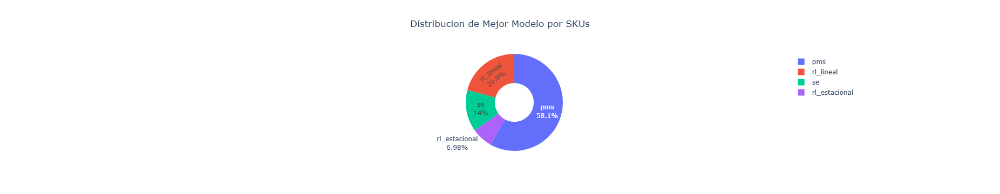

In [95]:
df_minimos, df_final, reporte_error_skus = comparar_y_graficar_modelos(reporte_error_skus)

In [96]:
def concatenar_forecasts_pronosticos(*dfs):
    # Concatenar todos los DataFrames recibidos en una sola lista
    df_todos_pronosticos = pd.concat(dfs)
    
    # Asegurar que la columna 'Codigo' sea de tipo string
    df_todos_pronosticos['CODIGO'] = df_todos_pronosticos['CODIGO'].astype(str)
    
    return df_todos_pronosticos

In [97]:
df_todos_pronosticos = concatenar_forecasts_pronosticos(
    df_forecast_final_pms, 
    df_forecast_final_se,
    df_forecast_final_rl_lineal,
    df_forecast_final_rl_estacional,
)

In [98]:
def obtener_mejor_pronostico(df_minimos, df_todos_pronosticos):
    # Crear una lista para almacenar los DataFrames filtrados
    lista_filtrados = [
        df_todos_pronosticos[
            (df_todos_pronosticos['CODIGO'] == row['CODIGO']) & 
            (df_todos_pronosticos['MODELO'] == row['MEJOR_MODELO'])
        ]
        for _, row in df_minimos.iterrows()
    ]
    
    # Concatenar todos los DataFrames filtrados
    df_pronosticos_mejor_modelo = pd.concat(lista_filtrados)
    
    # Pivotear el resultado para mostrar el forecast por Código, Modelo y Fecha
    df_pronosticos_12_meses = df_pronosticos_mejor_modelo.pivot_table(index=["CODIGO", "MODELO"], columns="FECHA", values="FORECAST")
    
    return df_pronosticos_mejor_modelo, df_pronosticos_12_meses

In [99]:
df_pronosticos_mejor_modelo, df_pronosticos_12_meses = obtener_mejor_pronostico(df_minimos, df_todos_pronosticos)
df_pronosticos_12_meses

,FECHA,2024-12-01,2025-01-01,2025-02-01,2025-03-01,2025-04-01,2025-05-01,2025-06-01,2025-07-01,2025-08-01,2025-09-01,2025-10-01,2025-11-01
CODIGO,MODELO,,,,,,,,,,,,
PT002,pms,37554.380952,37554.380952,37554.380952,37554.380952,37554.380952,37554.380952,37554.380952,37554.380952,37554.380952,37554.380952,37554.380952,37554.380952
PT003,pms,15491.250000,15491.250000,15491.250000,15491.250000,15491.250000,15491.250000,15491.250000,15491.250000,15491.250000,15491.250000,15491.250000,15491.250000
PT004,rl_lineal,15752.714489,15871.085070,15989.455651,16107.826232,16226.196813,16344.567394,16462.937975,16581.308556,16699.679137,16818.049718,16936.420299,17054.790880
PT005,pms,21236.500000,21236.500000,21236.500000,21236.500000,21236.500000,21236.500000,21236.500000,21236.500000,21236.500000,21236.500000,21236.500000,21236.500000
PT006,pms,72121.489897,72121.489897,72121.489897,72121.489897,72121.489897,72121.489897,72121.489897,72121.489897,72121.489897,72121.489897,72121.489897,72121.489897
PT007,pms,24843.000000,24843.000000,24843.000000,24843.000000,24843.000000,24843.000000,24843.000000,24843.000000,24843.000000,24843.000000,24843.000000,24843.000000
PT020,pms,35098.000000,35098.000000,35098.000000,35098.000000,35098.000000,35098.000000,35098.000000,35098.000000,35098.000000,35098.000000,35098.000000,35098.000000
PT024,pms,1036.571429,1036.571429,1036.571429,1036.571429,1036.571429,1036.571429,1036.571429,1036.571429,1036.571429,1036.571429,1036.571429,1036.571429
PT025,pms,1336.250000,1336.250000,1336.250000,1336.250000,1336.250000,1336.250000,1336.250000,1336.250000,1336.250000,1336.250000,1336.250000,1336.250000


In [106]:
df_pronosticos_12_meses.index.unique(0)

Index(['PT002', 'PT003', 'PT004', 'PT005', 'PT006', 'PT007', 'PT020', 'PT024',
       'PT025', 'PT026', 'PT031', 'PT033', 'PT034', 'PT035', 'PT042', 'PT043',
       'PT045', 'PT046', 'PT047', 'PT048', 'PT049', 'PT050', 'PT052', 'PT053',
       'PT054', 'PT055', 'PT056', 'PT057', 'PT064', 'PT065', 'PT066', 'PT070',
       'PT071', 'PT072', 'PT073', 'PT074', 'PT075', 'PT076', 'PT078', 'PT079',
       'PT080', 'PT081', 'PT082'],
      dtype='object', name='CODIGO')

In [100]:
def graficar_xyz(df_final, x, y):
    # Hacer una copia del DataFrame original para procesar los datos
    df_xyz = df_final.copy()

    # Limpiar los valores, eliminando el símbolo de porcentaje y convirtiendo a tipo float
    for col in ['pms', 
                'se', 
                'rl_lineal',
                'rl_estacional',
                #'xgb_local',
                #'xgb_global', 
                #'lgbm_local',
                #'lgbm_global'
               ]:
        df_xyz[col] = df_xyz[col].str.rstrip('%').astype(float)
    
    # Función para clasificar cada valor en X, Y o Z
    def classify_value(val, x, y):
        if 0 < val < x:
            return 'X'
        elif x <= val < y:
            return 'Y'
        else:
            return 'Z'

    # Diccionarios para almacenar los resultados de las clasificaciones
    classification_results = {}
    classification_results_percentages = {}

    # Clasificar y contar los valores para cada columna
    for col in ['pms', 
                'se',
                'rl_lineal',
                'rl_estacional',
                #'xgb_local',
                #'xgb_global', 
                #'lgbm_local', 
                #'lgbm_global'
               ]:
        # Usar una función lambda para pasar x e y a classify_value
        classification = df_xyz[col].apply(lambda val: classify_value(val, x, y))
        classification_counts = classification.value_counts()
        total_count = len(classification)
        classification_percentages = round((classification_counts / total_count) * 100, 2)

        classification_results[col] = classification_counts
        classification_results_percentages[col] = classification_percentages

    # Convertir los resultados en DataFrames
    classification_df = pd.DataFrame(classification_results).fillna(0).astype(int).reindex(['X','Y','Z'])
    classification_percent_df = pd.DataFrame(classification_results_percentages).fillna(0).reindex(['X','Y','Z'])

    # Ordenar los datos por el porcentaje de la categoría 'X'
    sorted_data_percent = classification_percent_df.T.sort_values(by='X', ascending=False).reset_index()
    sorted_data_count = classification_df.T.sort_values(by='X', ascending=False).reset_index()

    # Fusionar datos de porcentajes y conteos
    sorted_data_combined = sorted_data_percent.melt(id_vars=['index'], value_vars=['X', 'Y', 'Z'], 
                                                    var_name='Clasificación', value_name='Porcentaje')
    sorted_data_combined['Conteo'] = sorted_data_count.melt(id_vars=['index'], value_vars=['X', 'Y', 'Z'], 
                                                           var_name='Clasificación', value_name='Conteo')['Conteo']

    # Renombrar la columna 'index' a 'Modelo'
    sorted_data_combined = sorted_data_combined.rename(columns={'index': 'Modelo'})

    # Definir la paleta de colores
    new_color_palette = {'X': 'navy', 'Y': 'lightblue', 'Z': '#7f7f7f'}

    # Crear el gráfico de barras apiladas
    fig = px.bar(
        sorted_data_combined,
        x='Modelo',
        y='Porcentaje',
        color='Clasificación',
        text=sorted_data_combined.apply(lambda row: f"{row['Conteo']} skus<br>{int(row['Porcentaje'])}%", axis=1),
        title='Porcentajes y Conteos por Modelo de Pronóstico',
        color_discrete_map=new_color_palette
    )

    # Ajustar el layout del gráfico para mejor visualización
    fig.update_layout(
        barmode='stack',
        template='ggplot2',
        title_x=0.5,
        yaxis_title='Porcentaje (%)',
        xaxis_title='Modelo de Pronóstico',
        legend_title='Clasificación',
        uniformtext_minsize=8,
        uniformtext_mode='hide',
    )

    # Ajustar el texto dentro de las barras
    fig.update_traces(textposition='inside', textfont_size=8)

    # Mostrar el gráfico
    fig.show()

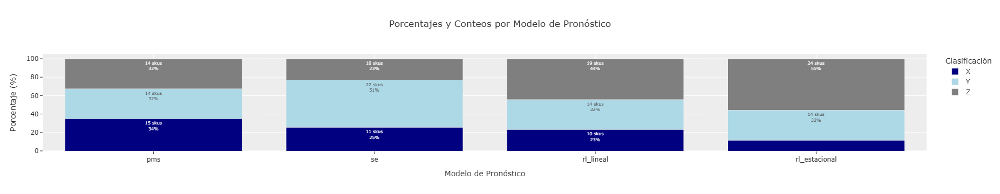

In [101]:
x = 35
y = 70
graficar_xyz(df_final, x, y)

In [108]:
def crear_grafica_pronostico(df_mes_ceros, df_todos_pronosticos, df_pronosticos_mejor_modelo):
    # Obtener modelos únicos
    modelos_unicos = df_todos_pronosticos['MODELO'].unique()
    
    # Generar una paleta de colores en seaborn
    dark_colors = sns.color_palette("muted", n_colors=len(modelos_unicos)).as_hex()
    
    # Crear un diccionario para asignar colores a cada modelo
    color_mapping = {modelo: dark_colors[i] for i, modelo in enumerate(modelos_unicos)}

    # Lista de códigos únicos
    codigos_unicos = df_pronosticos_12_meses.index.unique(0)
    #codigos_unicos = df_mes_ceros["CODIGO"].unique()

    # Crear una figura
    fig = go.Figure()

    # Crear todas las trazas (una por cada Código y Modelo) y agregar al gráfico
    for codigo in codigos_unicos:
        # Filtrar df_mes por Codigo (para graficar la demanda)
        df_mes_filtrado = df_mes_ceros[df_mes_ceros["CODIGO"] == codigo]

        # Filtrar df_todos_pronosticos por Codigo (para graficar todos los pronósticos de modelos)
        df_todos_pronosticos_filtrado = df_todos_pronosticos[df_todos_pronosticos["CODIGO"] == codigo]

        # Filtrar df_pronosticos_mejor_modelo para obtener el mejor modelo de ese código
        df_pronosticos_filtrado = df_pronosticos_mejor_modelo[df_pronosticos_mejor_modelo["CODIGO"] == codigo]
        mejor_modelo = df_pronosticos_filtrado["MODELO"].values[0]  # Extraer el mejor modelo para ese código

        # Agregar la traza de DEMANDA para este código (inicialmente invisible)
        fig.add_trace(go.Scatter(
            x=df_mes_filtrado.index, 
            y=df_mes_filtrado["DEMANDA"], 
            mode='lines',
            name=f'{codigo}',
            line=dict(color='navy'),
            visible=False  # Inicialmente invisible
        ))

        # Agregar una traza para cada modelo en df_todos_pronosticos_filtrado
        for modelo in modelos_unicos:
            # Filtrar por el modelo específico dentro del código seleccionado
            df_modelo_filtrado = df_todos_pronosticos_filtrado[df_todos_pronosticos_filtrado["MODELO"] == modelo]

            # Determinar el estilo de la línea
            if modelo == mejor_modelo:
                line_style = dict(dash='solid', color='#FF4500', width=2.5)  # Continua para el mejor modelo
            else:
                line_style = dict(dash='dot', color=color_mapping[modelo])  # Punteada para los demás modelos

            # Agregar la traza de FORECAST de este modelo (inicialmente invisible)
            fig.add_trace(go.Scatter(
                x=df_modelo_filtrado.index, 
                y=df_modelo_filtrado["FORECAST"], 
                mode='lines',
                name=f'{modelo}',
                line=line_style,
                visible=False  # Inicialmente invisible
            ))

    # Crear botones para el dropdown del primer menú (Códigos)
    dropdown_buttons_codigo = []
    for i, codigo in enumerate(codigos_unicos):
        # Visibilidad de DEMANDA y todas las trazas de pronósticos para este código
        visibility = [False] * len(fig.data)  # Inicializar todas las trazas como invisibles

        # Mostrar DEMANDA
        visibility[i * (len(modelos_unicos) + 1)] = True  

        # Mostrar todas las trazas de los modelos para el código seleccionado
        for j in range(len(modelos_unicos)):
            visibility[i * (len(modelos_unicos) + 1) + j + 1] = True

        # Botón para seleccionar el código
        dropdown_buttons_codigo.append(
            dict(
                args=[{"visible": visibility}],  # Cambiar la visibilidad de las trazas
                label=str(codigo),  # Etiqueta del código
                method="update"
            )
        )

    # Mostrar la primera DEMANDA y todos los modelos del primer código por defecto
    fig.data[0].visible = True
    for j in range(len(modelos_unicos)):
        fig.data[j + 1].visible = True

    # Configurar el layout con el menú dropdown
    fig.update_layout(
        template="ggplot2",
        updatemenus=[
            # Menú desplegable para seleccionar el Código
            dict(
                buttons=dropdown_buttons_codigo,
                direction="down",
                showactive=True,
                x=0.01, y=1.25,  # Posición del dropdown
                xanchor="left",
                yanchor="top"
            )
        ],
        title="Demanda vs Pronóstico por Código",
        xaxis_title="Fecha",
        yaxis_title="Demanda",
        showlegend=True,
        xaxis=dict(showgrid=True, gridcolor='lightgray'),
        yaxis=dict(showgrid=True, gridcolor='lightgray'),
        legend=dict(
            orientation="v",
            yanchor="middle",
            xanchor="left",
            x=1.05,
            y=0.5
        ),
        height=400
    )

    return fig

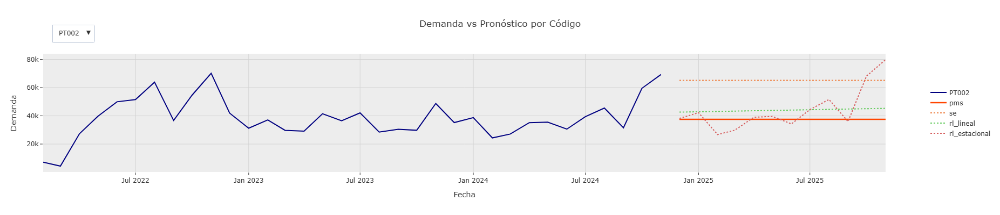

In [109]:
fig = crear_grafica_pronostico(df_mes, df_todos_pronosticos, df_pronosticos_mejor_modelo)
fig.show()